# Effective tuning iLOVECLIM
First run the experiments ATM-EVO_MEAN20 and ATM-EVO_MEAN100 before doing their effective tunings here. 
Author: Maya Janvier

Date: 11/07/2023

In [1]:
import xarray as xr 
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import subprocess
import os
import json
from joblib import Parallel, delayed
import multiprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from IPython.display import display
from scipy.stats import entropy
import joblib
import math 
import warnings
warnings.filterwarnings("ignore")
joblib.__version__

'1.1.0'

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
num_cores = multiprocessing.cpu_count()
num_cores

48

In [3]:
with open("parameters/simulations/ATM-EVO_MEAN100_params.json") as fp: #do not change this file 
    parameters_dict = json.load(fp)

NB_YEAR_SIMU = parameters_dict["NB_YEAR_SIMU"]
NB_YEAR_TRUTH = parameters_dict["NB_YEAR_TRUTH"]
NAME_START = parameters_dict["NAME_START"]
NAME_EXP = parameters_dict["NAME_EXP"]

parameters_dict

{'NB_YEAR_SIMU': 100,
 'NB_YEAR_TRUTH': 100,
 'NAME_START': 'SHI100_START',
 'NAME_EXP': 'ATM-EVO_MEAN_100L',
 'WAVE_K_MEANS': 3,
 'WAVE_CANDIDATE': 0,
 'OPT_CLUSTERS': 6}

In [4]:
with open("parameters/truth/truth_params.json") as fp:
    param_truth = json.load(fp)
    
N_PARAM = len(param_truth)
param_truth

{'ampwir': 1.0,
 'expir': 0.4,
 'relhmax': 0.83,
 'alphd': 0.72,
 'ai': 300,
 'cwdrag': 0.0021,
 'aitd': 300,
 'avkb': 1.5e-05,
 'cgren': 0.04}

# Definition of useful functions

In [5]:
# PCA     
def reduce_pca(vector):   
    scaler = StandardScaler().fit(vector)
    datascaled = scaler.transform(vector)
    ###########
    pca = PCA(n_components=0.99, svd_solver = 'full') #paramètres représentent 99% de la variance totale
    pca.fit(datascaled)
    reduceddata = pca.transform(datascaled)
    return reduceddata, scaler, pca

def reduce_pca_usingwave1(vector, scaler, pca): 
    datascaled = scaler.transform(vector)
    return pca.transform(datascaled)

In [6]:
# save data 
def build_save_dataframe_metrics_to_csv(targets_reduced, nb_wave):
    df_metrics = pd.DataFrame()
    for i in range(targets_reduced.shape[1]):
        df_metrics['pca_'+str(i)] = targets_reduced[:,i]
    df_metrics.to_csv(f'../DATA/{EXP}/df_metrics_newPCA_wave{nb_wave}.csv', index=False)
    return df_metrics

def build_save_dataframe_obs_to_csv(targets_reduced, obs_reduced, nb_wave):
    df_obs_nonoise = pd.DataFrame()
    for i in range(targets_reduced.shape[1]):
        df_obs_nonoise['pca_'+str(i)] = obs_reduced[:,i]
    df_obs_nonoise.to_csv(f'../DATA/{EXP}/df_obs_nonoise_newPCA_wave{nb_wave}.csv', index=False)
    return df_obs_nonoise

## Metrics
Simple for now: only mean 

In [7]:
def metrics_atm_evo_n_last_years(ds_atm, ds_evolu, metrics_list, n_year=NB_YEAR_SIMU):
    variables = []
    # for ds_atm
    q = ds_atm.q.isel(time=slice(-(n_year+1),-1))
    ts = ds_atm.ts.isel(time=slice(-(n_year+1),-1))
    bm = ds_atm.bm.isel(time=slice(-(n_year+1),-1))
    shf = ds_atm.shf.isel(time=slice(-(n_year+1),-1))
    lhf = ds_atm.lhf.isel(time=slice(-(n_year+1),-1))
    r = ds_atm.r.isel(time=slice(-(n_year+1),-1))
    alb = ds_atm.alb.isel(time=slice(-(n_year+1),-1))
    ssr = ds_atm.ssr.isel(time=slice(-(n_year+1),-1))
    tsr = ds_atm.tsr.isel(time=slice(-(n_year+1),-1))
    Str = ds_atm.str.isel(time=slice(-(n_year+1),-1))
    ttr = ds_atm.ttr.isel(time=slice(-(n_year+1),-1))
    evap = ds_atm.evap.isel(time=slice(-(n_year+1),-1))
    pp = ds_atm.pp.isel(time=slice(-(n_year+1),-1))
    sp = ds_atm.sp.isel(time=slice(-(n_year+1),-1))
    snow = ds_atm.snow.isel(time=slice(-(n_year+1),-1))
    
    var_atm = []
    
    # for ds_evolu
    ADPro = ds_evolu.ADPro.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    AABex = ds_evolu.AABex.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    Fc30A = ds_evolu.Fc30A.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    T1mo = ds_evolu.T1mo.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    S1mo = ds_evolu.S1mo.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    VOLN = ds_evolu.VOLN.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    VOLS = ds_evolu.VOLS.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    A15N = ds_evolu.A15N.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    A15S = ds_evolu.A15S.isel(lat=0, lev=0, lon=0).isel(time=slice(-(n_year+1),-1))
    
    variables = [q, ts, bm, shf, lhf, r, alb, ssr, tsr, Str, ttr, evap, pp, sp, snow,
                 ADPro, AABex, Fc30A, T1mo, S1mo, VOLN, VOLS, A15N, A15S]

    metrics_out = []
    
    for metric in metrics_list:
        metrics_out += metric(variables)                 
    
    return np.array(metrics_out)


In [8]:
def mean_metric(ds_list):
    return [ds.mean().item() for ds in ds_list]

# Initialisation : ground truth
Run iLOVECLIM once with ground truth values for parameters: I don't know how to change parameters values for now, so we'll take the 100 years simulation as ground truth. 

In [9]:
EXP = NAME_START
if 'EVO' in NAME_EXP:
    metrics = metrics_atm_evo_n_last_years # atmospheric and oceanic metrics
else:
    metrics = metrics_atm_n_last_years # atmospheric only 
    
METRICS_LIST = [mean_metric] # type of metric

In [10]:
ground_truth_path = '/homedata/mjanvier/iloveclim/data/SHI_TRUTH_ecbilt_clio/output008000/'
evolu_truth = xr.open_dataset(ground_truth_path+"ocean/myevolu.nc").isel(time=slice(0,100*12))
atmos_truth = xr.open_dataset(ground_truth_path+"atmos/atmym008000.nc", decode_times=False).isel(time=slice(0,100))

In [11]:
display(atmos_truth)
display(evolu_truth)

<xarray.Dataset>
Dimensions:      (lon: 64, bnds: 2, lat: 32, P_T3: 3, P_T4: 4, P_U3: 3,
                  time: 100)
Coordinates:
  * lon          (lon) float32 0.0 5.625 11.25 16.88 ... 337.5 343.1 348.8 354.4
  * lat          (lat) float32 -85.76 -80.27 -74.74 -69.21 ... 74.74 80.27 85.76
  * P_T3         (P_T3) float32 1e+04 3.5e+04 6.5e+04
  * P_T4         (P_T4) float32 1e+04 3.5e+04 6.5e+04 1e+05
  * P_U3         (P_U3) float32 2e+04 5e+04 8e+04
  * time         (time) float32 8.001e+03 8.002e+03 ... 8.099e+03 8.1e+03
Dimensions without coordinates: bnds
Data variables: (12/42)
    lon_bounds   (lon, bnds) float64 ...
    lat_bounds   (lat, bnds) float64 ...
    time_bounds  (time, bnds) float64 ...
    q            (time, lat, lon) float64 ...
    ts           (time, lat, lon) float64 ...
    tstrat       (time, lat, lon) float64 ...
    ...           ...
    u            (time, P_U3, lat, lon) float64 ...
    v            (time, P_U3, lat, lon) float64 ...
    omega        (time, P_T3, lat, lon) float64 ...
    psi          (time, P_U3, lat, lon) float64 ...
    chi          (time, P_U3, lat, lon) float64 ...
    geopg        (time, P_U3, lat, lon) float64 ...
Attributes: (12/26)
    title:                  iLOVECLIM1.1.1 model output prepared for unknown-...
    institution:            LSCE - Laboratoire des Sciences du Climat et de l...
    source:                 incremented from iLOVECLIM1.1 (2018) - atmosphere...
    contact:                didier.roche@lsce.ipsl.fr, didier.roche@vu.nl
    project_id:             ACCLIMATE ERC / FP7/2007-2013 Grant agreement n° ...
    table_id:               Table Amon ??? ref to be updated
    ...                     ...
    physics_version:        1
    tracking_id:            ba494858-2c5d-4283-75a0-14106bcf484b
    product:                output
    frequency:              yr
    creation_date:          2023-06-07T15:42:53Z
    modeling_realm:         atmos

<xarray.Dataset>
Dimensions:  (lon: 1, lat: 1, lev: 1, time: 1200)
Coordinates:
  * lon      (lon) float32 1.0
  * lat      (lat) float32 1.0
  * lev      (lev) float32 1.0
  * time     (time) float32 1.0 2.0 3.0 4.0 ... 1.198e+03 1.199e+03 1.2e+03
Data variables: (12/97)
    NoIt     (time, lev, lat, lon) float32 ...
    Tyr      (time, lev, lat, lon) float32 ...
    EgAjC    (time, lev, lat, lon) float32 ...
    V_AjC    (time, lev, lat, lon) float32 ...
    D_Eta    (time, lev, lat, lon) float32 ...
    M_Eta    (time, lev, lat, lon) float32 ...
    ...       ...
    SPNG     (time, lev, lat, lon) float32 ...
    BERG     (time, lev, lat, lon) float32 ...
    ThEx     (time, lev, lat, lon) float32 ...
    ISMM     (time, lev, lat, lon) float32 ...
    IcbN     (time, lev, lat, lon) float32 ...
    IcbS     (time, lev, lat, lon) float32 ...
Attributes:
    history:      LOVECLIM Ocean output (evolu) converted by procevolu
    title:        Evolution of the Ocean (EVOLU) CLIO
    institution:  VU AMS, LUDUS, LOVECLIM
    comment:      Temporal Resolution in months

In [12]:
TrueTraj = metrics(atmos_truth, evolu_truth, METRICS_LIST)
TrueTraj.shape

(24,)

# Wave 1

In [13]:
inputs_1 = pd.read_csv(f"../DATA/{EXP}/df_inputs_newPCA_wave1.csv") #.values # valeurs après step 1 (4*10 training vectors, size 4, selected)
inputs_1.shape

(90, 9)

### Get all the atmos and evolu files for metrics
Wave 1: 1 to 50: Wave 2: 51 to 100 etc...

In [14]:
 def get_metrics_wave(nb_wave, n_param=N_PARAM, sample_size=10):
    root = '/homedata/mjanvier/iloveclim/wkdir'
    results = []
    indices_simu = []
    fails = []
    for n_simu in range((nb_wave-1)*n_param*sample_size+1, nb_wave*n_param*sample_size+1):
        path_evolu = root+f'/{EXP}{n_simu}_ecbilt_clio/run/outputdata/ocean/myevolu.nc' 
        path_atmos = root+f'/{EXP}{n_simu}_ecbilt_clio/run/outputdata/atmos/atmym008000.nc'

        if os.path.exists(path_evolu):
            ds_evolu = xr.open_dataset(path_evolu)
            ds_atmos = xr.open_dataset(path_atmos, decode_times=False)
            results.append(metrics(ds_atmos, ds_evolu, METRICS_LIST))
            indices_simu.append(n_simu)
        else:
            fails.append(n_simu)

    if len(fails) != 0:
        fails = np.array(fails) - N_PARAM*10*(nb_wave-1)
        (pd.DataFrame(fails)).to_csv(f'../DATA/{EXP}/fails_wave{nb_wave}.csv', index=False)
    return np.array(results), np.array(indices_simu)- 1 - N_PARAM*10*(nb_wave-1)

In [15]:
def wave_1(inputs, true_traj):    
    targets, valid_simus = get_metrics_wave(1)

    # ensure the simulations converged
    inputs = inputs.iloc[valid_simus]
    inputs = inputs.values[np.all(np.isfinite(targets), axis=1)] 
    
    targets = targets[np.all(np.isfinite(targets), axis=1)] 
    
    # PCA wave 1
    targetsreduced, SC, PC = reduce_pca(targets)
    Obsreduced = reduce_pca_usingwave1(true_traj[None,:], SC, PC)
    print('PCA reduced target shape', targetsreduced.shape)
    print('PCA reduced obs shape', Obsreduced.shape)
    
    # save dataframe
    df_metrics = build_save_dataframe_metrics_to_csv(targetsreduced, 1)
    df_obs = build_save_dataframe_obs_to_csv(targetsreduced, Obsreduced, 1)
    
    
    print('Metrics')
    display(df_metrics)
    
    return Obsreduced, SC, PC

In [16]:
ObsReduced, SC, PC = wave_1(inputs_1 , TrueTraj)

PCA reduced target shape (86, 10)
PCA reduced obs shape (1, 10)
Metrics


,pca_0,pca_1,pca_2,pca_3,pca_4,pca_5,pca_6,pca_7,pca_8,pca_9
0,-0.946422,-1.048858,0.184430,-0.143714,-0.059075,-0.375501,0.750794,0.029470,0.127768,0.094554
1,-1.137672,-0.067382,-0.275984,-1.035340,0.241016,0.133327,-0.027890,-0.030182,-0.162100,-0.071100
2,-0.708582,-1.047514,-0.334829,-0.207658,0.236860,-0.478999,0.641737,-0.114365,0.007587,0.113511
3,-0.800398,-0.392561,-0.660244,-0.787193,0.218540,0.130582,-0.398621,-0.148232,-0.352251,-0.058361
4,-0.520758,-1.758092,1.389205,-0.433228,-0.648288,-0.784326,0.672413,-0.023329,0.537480,0.189214
...,...,...,...,...,...,...,...,...,...,...
81,3.995409,-1.178896,-0.186853,1.272676,-0.039252,2.123517,-0.693744,-0.329394,0.259161,-0.438040
82,3.545715,-1.391844,-1.471670,1.628223,0.098588,0.161072,0.902115,0.280038,-0.243112,0.454140
83,-1.806763,4.031992,0.706289,3.157133,-1.800821,-0.782883,-0.679513,-0.001386,-0.471120,-0.336751
84,1.298475,-2.989124,1.243274,-0.696729,-0.228689,0.067017,-0.385817,-0.025155,-0.844162,-0.061942


# Effective tuning

In [17]:
def plot_PCA_candidates(simusreduced, nb_candidates):
    simus_df = pd.DataFrame()
    for i in range(simusreduced.shape[1]):
        simus_df['PC'+str(i+1)] = simusreduced[:,i]
        
    simus_df.loc[len(simus_df)]=list(ObsReduced[0,:]) # add obs vector 
    
    simusdftranspose = simus_df.T
    simusdftranspose.columns = [f'config{n}' for n in range (1, nb_candidates+1)]+ ['Obs']
    display(simusdftranspose)
    
    # on regarde les composantes principales des metriques obtenues 
    sns.set_context("talk", font_scale=0.8, rc={"lines.linewidth": 1.5})

    simusdftranspose.plot()

In [18]:
def plot_distrib_evolu(candidates, name_exp):
    root = '/homedata/mjanvier/iloveclim/wkdir' 
    figure, axes = plt.subplots(3, 3, figsize=(25,10))
    
    ds_truth_evolu = evolu_truth.mean(dim=['lon', 'lat', 'lev'])
    # for truth
    ADPro_t = ds_truth_evolu.ADPro
    AABex_t = ds_truth_evolu.AABex
    Fc30A_t = ds_truth_evolu.Fc30A
    T1mo_t = ds_truth_evolu.T1mo
    S1mo_t = ds_truth_evolu.S1mo
    VOLN_t = ds_truth_evolu.VOLN
    VOLS_t = ds_truth_evolu.VOLS
    A15N_t = ds_truth_evolu.A15N
    A15S_t = ds_truth_evolu.A15S
    
    truth_evo = [ADPro_t, AABex_t, Fc30A_t, T1mo_t, S1mo_t, VOLN_t, VOLS_t, A15N_t, A15S_t]
    ind = 0
    for i in range(3):
        for j in range(3):
            if ind < 9:
                var_t = truth_evo[ind]
                sns.kdeplot(var_t,label='truth', ax=axes[i,j], linestyle="--",legend=False)
                ind += 1
        
    for nb_candidate in candidates:
        path_evolu = root+f'/{EXP}_{name_exp}{nb_candidate}_ecbilt_clio/run/outputdata/ocean/myevolu.nc' 
        ds_evolu = xr.open_dataset(path_evolu).mean(dim=['lon', 'lat', 'lev'])

        # for ds_evolu
        ADPro = ds_evolu.ADPro
        AABex = ds_evolu.AABex
        Fc30A = ds_evolu.Fc30A
        T1mo = ds_evolu.T1mo
        S1mo = ds_evolu.S1mo
        VOLN = ds_evolu.VOLN
        VOLS = ds_evolu.VOLS
        A15N = ds_evolu.A15N
        A15S = ds_evolu.A15S

        var_evo = [ADPro, AABex, Fc30A, T1mo, S1mo, VOLN, VOLS, A15N, A15S]

        ind = 0
        for i in range(3):
            for j in range(3):
                if ind < 9:
                    var = var_evo[ind]
                    sns.kdeplot(var,label=f'config{nb_candidate}', ax=axes[i,j],legend=False)
                    ind += 1
                
    handles, labels = axes[1,2].get_legend_handles_labels()
    figure.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.95),
              ncol=6, fancybox=True, shadow=False)
    
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.5,  
                    wspace=0.4, 
                    hspace=0.4)
   

In [31]:
def plot_distrib_atm(candidates, name_exp):
    root = '/homedata/mjanvier/iloveclim/wkdir' 
    figure, axes = plt.subplots(3, 5, figsize=(30,10))
    
    ds_truth_atmos = atmos_truth.mean(dim=['P_T3', 'P_T4', 'P_U3', 'lon', 'lat'])
    # for truth
    q_t = ds_truth_atmos.q
    ts_t = ds_truth_atmos.ts
    bm_t = ds_truth_atmos.bm
    shf_t = ds_truth_atmos.shf
    lhf_t = ds_truth_atmos.lhf
    r_t = ds_truth_atmos.r
    alb_t = ds_truth_atmos.alb
    ssr_t = ds_truth_atmos.ssr
    tsr_t = ds_truth_atmos.tsr
    Str_t= ds_truth_atmos.str
    ttr_t = ds_truth_atmos.ttr
    evap_t = ds_truth_atmos.evap
    pp_t = ds_truth_atmos.pp
    sp_t = ds_truth_atmos.sp
    snow_t = ds_truth_atmos.snow
    
    truth_atm = [q_t, ts_t, bm_t, shf_t, lhf_t, r_t, alb_t, ssr_t, tsr_t, Str_t, ttr_t, evap_t, pp_t, sp_t, snow_t]
    #truth_atm = [r_t, q_t, shf_t, Str_t]
    ind = 0
    for i in range(3):
        for j in range(5):
            if ind < 15:
                var_t = truth_atm[ind]
                sns.kdeplot(var_t,label='truth', ax=axes[i,j], linestyle="--",legend=False)
                ind += 1
        
    for nb_candidate in candidates:
        path_atmos = root+f'/{EXP}_{name_exp}{nb_candidate}_ecbilt_clio/run/outputdata/atmos/atmym008000.nc'
        ds_atmos = xr.open_dataset(path_atmos, decode_times=False).mean(dim=['P_T3', 'P_T4', 'P_U3', 'lon', 'lat'])

        # for ds_atm
        q = ds_atmos.q
        ts = ds_atmos.ts
        bm = ds_atmos.bm
        shf = ds_atmos.shf
        lhf = ds_atmos.lhf
        r = ds_atmos.r
        alb = ds_atmos.alb
        ssr = ds_atmos.ssr
        tsr = ds_atmos.tsr
        Str = ds_atmos.str
        ttr = ds_atmos.ttr
        evap = ds_atmos.evap
        pp = ds_atmos.pp
        sp = ds_atmos.sp
        snow = ds_atmos.snow

        var_atm = [q, ts, bm, shf, lhf, r, alb, ssr, tsr, Str, ttr, evap, pp, sp, snow]
        #var_atm = [r, q, shf, Str]

        ind = 0
        for i in range(3):
            for j in range(5):
                if ind < 15:
                    var = var_atm[ind]
                    sns.kdeplot(var,label=f'config{nb_candidate}', ax=axes[i,j],legend=False)
                    ind += 1
                
    handles, labels = axes[1,2].get_legend_handles_labels()
    figure.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 0.95),
              ncol=6, fancybox=True, shadow=False)
    
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.5,  
                    wspace=0.4, 
                    hspace=0.4)
   

In [20]:
def range_metric(metric):
    return (metric.min().values, metric.max().values)


def KL_div_obs(nb_candidate, name_exp):
    root = '/homedata/mjanvier/iloveclim/wkdir' 
    ds_truth_evolu = evolu_truth.mean(dim=['lon', 'lat', 'lev'])
    ds_truth_atmos = atmos_truth.mean(dim=['P_T3', 'P_T4', 'P_U3', 'lon', 'lat'])
    
    path_atmos = root+f'/{EXP}_{name_exp}{nb_candidate}_ecbilt_clio/run/outputdata/atmos/atmym008000.nc'
    ds_atmos = xr.open_dataset(path_atmos, decode_times=False).mean(dim=['P_T3', 'P_T4', 'P_U3', 'lon', 'lat'])
    path_evolu = root+f'/{EXP}_{name_exp}{nb_candidate}_ecbilt_clio/run/outputdata/ocean/myevolu.nc' 
    ds_evolu = xr.open_dataset(path_evolu).mean(dim=['lon', 'lat', 'lev'])
    
    # for truth
    q_t = ds_truth_atmos.q
    ts_t = ds_truth_atmos.ts
    bm_t = ds_truth_atmos.bm
    shf_t = ds_truth_atmos.shf
    lhf_t = ds_truth_atmos.lhf
    r_t = ds_truth_atmos.r
    alb_t = ds_truth_atmos.alb
    ssr_t = ds_truth_atmos.ssr
    tsr_t = ds_truth_atmos.tsr
    Str_t= ds_truth_atmos.str
    ttr_t = ds_truth_atmos.ttr
    evap_t = ds_truth_atmos.evap
    pp_t = ds_truth_atmos.pp
    sp_t = ds_truth_atmos.sp
    snow_t = ds_truth_atmos.snow
    
    ADPro_t = ds_truth_evolu.ADPro
    AABex_t = ds_truth_evolu.AABex
    Fc30A_t = ds_truth_evolu.Fc30A
    T1mo_t = ds_truth_evolu.T1mo
    S1mo_t = ds_truth_evolu.S1mo
    VOLN_t = ds_truth_evolu.VOLN
    VOLS_t = ds_truth_evolu.VOLS
    A15N_t = ds_truth_evolu.A15N
    A15S_t = ds_truth_evolu.A15S
    
    # simu
    q = ds_atmos.q
    ts = ds_atmos.ts
    bm = ds_atmos.bm
    shf = ds_atmos.shf
    lhf = ds_atmos.lhf
    r = ds_atmos.r
    alb = ds_atmos.alb
    ssr = ds_atmos.ssr
    tsr = ds_atmos.tsr
    Str = ds_atmos.str
    ttr = ds_atmos.ttr
    evap = ds_atmos.evap
    pp = ds_atmos.pp
    sp = ds_atmos.sp
    snow = ds_atmos.snow
    
    ADPro = ds_evolu.ADPro
    AABex = ds_evolu.AABex
    Fc30A = ds_evolu.Fc30A
    T1mo = ds_evolu.T1mo
    S1mo = ds_evolu.S1mo
    VOLN = ds_evolu.VOLN
    VOLS = ds_evolu.VOLS
    A15N = ds_evolu.A15N
    A15S = ds_evolu.A15S
    
    var = [q, ts, bm, shf, lhf, r, alb, ssr, tsr, Str, ttr, evap, pp, sp, snow, ADPro, AABex, Fc30A, T1mo, S1mo, VOLN, VOLS, A15N, A15S]
    var_t = [q_t, ts_t, bm_t, shf_t, lhf_t, r_t, alb_t, ssr_t, tsr_t, Str_t, ttr_t, evap_t, pp_t, sp_t, snow_t, ADPro_t, AABex_t, Fc30A_t, T1mo_t, S1mo_t, VOLN_t, VOLS_t, A15N_t, A15S_t]
    entropy_list = []
    entropy_dict = {}
    valid = 0
    fail_list =[]
    for i in range(len(var)):
        hist = np.histogram(var[i], range=range_metric(var_t[i]))[0]
        hist_truth = np.histogram(var_t[i])[0]

        ent = entropy(hist, hist_truth)
        if not np.isnan(ent):
            if not np.isinf(ent):
                entropy_list += [ent]
                valid += 1
                entropy_dict[var[i].name] = ent
        elif np.isnan(ent):
            fail_list.append(var[i].name)
        elif np.isinf(ent):
            fail_list.append(var[i].name)
            
    return np.median(entropy_list), valid, fail_list, entropy_dict

In [21]:
def format_candidates_iloveclim(type_exp, nb_wave):
    if type_exp == "direct":
        configs = pd.read_csv(f'../DATA/{EXP[3:]}/direct_candidates_wave_{nb_wave}.csv').values
        pd.DataFrame(configs).to_csv(f'../OUT_DATA/{EXP[3:]}_direct_CANDIDATE{nb_wave}HM_values.dat', header=None, sep='\t')
    else:
        if EXP == "ATM-EVO_MEAN_100L":
            configs = pd.read_csv(f'../DATA/{EXP}/candidates_wave_{nb_wave}.csv').values
            pd.DataFrame(configs).to_csv(f'../OUT_DATA/{EXP}_CANDIDATE{nb_wave}HM_values.dat', header=None, sep='\t')
        else:
            configs = pd.read_csv(f'../DATA/{EXP[3:]}/candidates_wave_{nb_wave}.csv').values
            pd.DataFrame(configs).to_csv(f'../OUT_DATA/{EXP[3:]}_CANDIDATE{nb_wave}HM_values.dat', header=None, sep='\t')
    
    display(pd.DataFrame(configs))
    return(configs)
    

In [22]:
def get_metrics_candidates(nb_candidates,name):
    root = '/homedata/mjanvier/iloveclim/wkdir'
    results = []
    for nb_candidate in range(1,nb_candidates+1):
        path_evolu = root+f'/{EXP}_{name}{nb_candidate}_ecbilt_clio/run/outputdata/ocean/myevolu.nc' 
        path_atmos = root+f'/{EXP}_{name}{nb_candidate}_ecbilt_clio/run/outputdata/atmos/atmym008000.nc'

        ds_evolu = xr.open_dataset(path_evolu)
        ds_atmos = xr.open_dataset(path_atmos, decode_times=False)
        results.append(metrics(ds_atmos, ds_evolu, METRICS_LIST))
    return np.array(results)

## 1. ATM-EVO_MEAN100: simulate k means candidates wave 3

In [41]:
EXP = "ATM-EVO_MEAN_100L"

In [24]:
configs100 = format_candidates_iloveclim("k_means", 3)

,0,1,2,3,4,5,6,7,8
0,0.809082,0.470196,0.815756,0.640481,316.616262,654.916126,0.002400,0.000019,0.083611
1,0.952624,0.414219,0.824029,0.688634,706.717808,443.480476,0.001597,0.000020,0.070403
2,1.016354,0.388033,0.831881,0.724654,925.782097,656.572607,0.001468,0.000036,0.030113
3,1.263280,0.341520,0.829311,0.702312,475.236399,576.267357,0.002064,0.000027,0.038889
4,0.744042,0.511138,0.825792,0.730153,397.134665,548.633276,0.002195,0.000018,0.031843
5,1.118633,0.356443,0.839435,0.652927,433.612381,315.973025,0.001984,0.000018,0.085306


**_Launch candidates simulations_**

In [25]:
wave3_metrics100 = get_metrics_candidates(6, "CANDIDATE")
wave3_PCA100 = reduce_pca_usingwave1(wave3_metrics100, SC, PC)

,config1,config2,config3,config4,config5,config6,Obs
PC1,-2.598284,-2.763639,-3.021842,-2.730076,-2.736393,-2.554673,-2.559873
PC2,1.570175,1.485908,1.631407,1.869641,1.970033,1.881263,1.785502
PC3,0.337378,0.436420,0.215171,0.190452,0.410580,0.501977,0.207387
PC4,0.798598,1.045818,0.450795,0.841537,0.876821,0.835292,0.890517
PC5,-0.055366,-0.154487,0.105031,0.129310,0.152164,-0.207219,-0.152073
PC6,-1.269503,-1.308638,-1.091657,-1.066045,-0.946533,-1.274787,-1.117770
PC7,0.226126,0.564470,0.737442,0.524701,0.910872,0.414242,0.426662
PC8,0.218699,0.152075,0.299955,0.135356,0.006546,-0.170529,-0.015803
PC9,0.266610,-0.031217,0.032788,0.003977,0.072286,-0.193578,0.045110
PC10,-0.417552,-0.254362,-0.359051,-0.361191,-0.476556,-0.159875,-0.453128


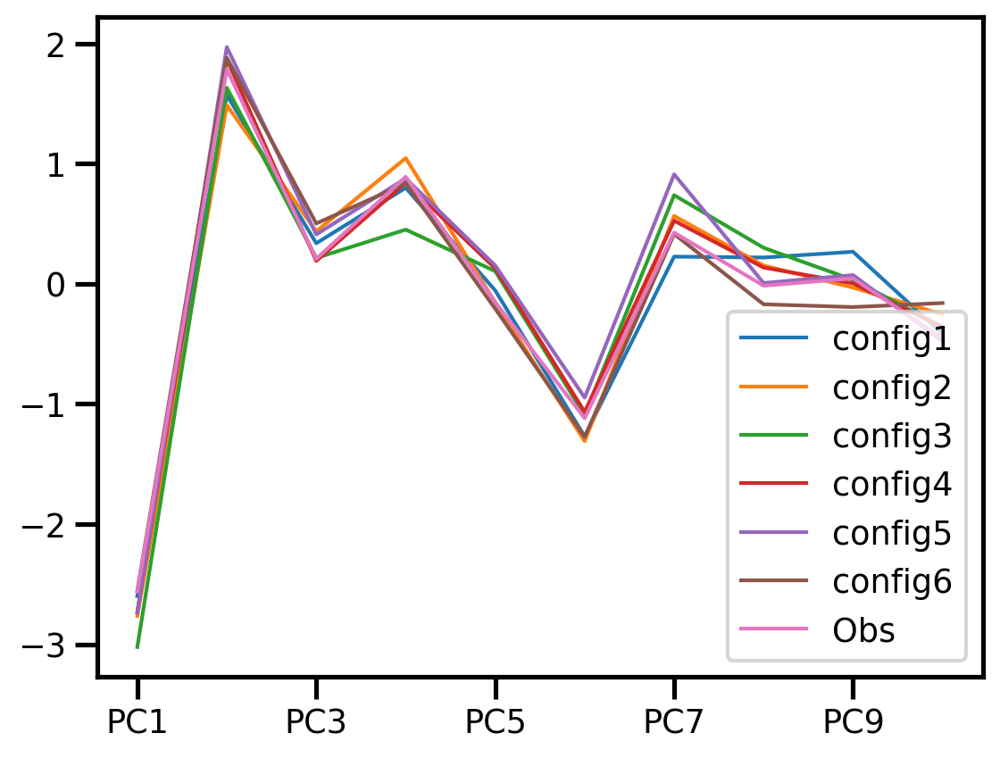

In [26]:
plot_PCA_candidates(wave3_PCA100,6)

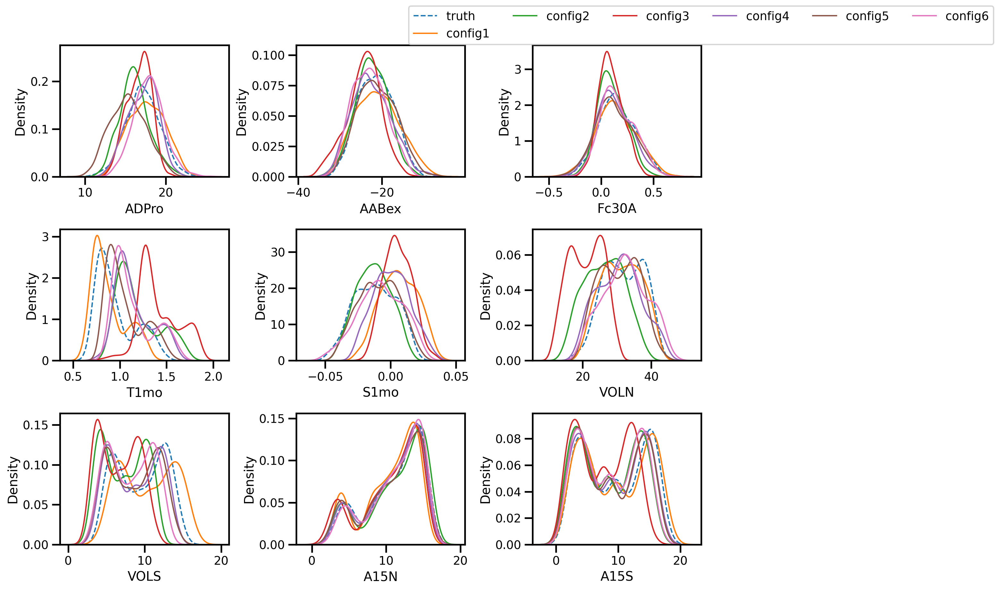

In [27]:
plot_distrib_evolu([1,2,3,4,5,6], "CANDIDATE")

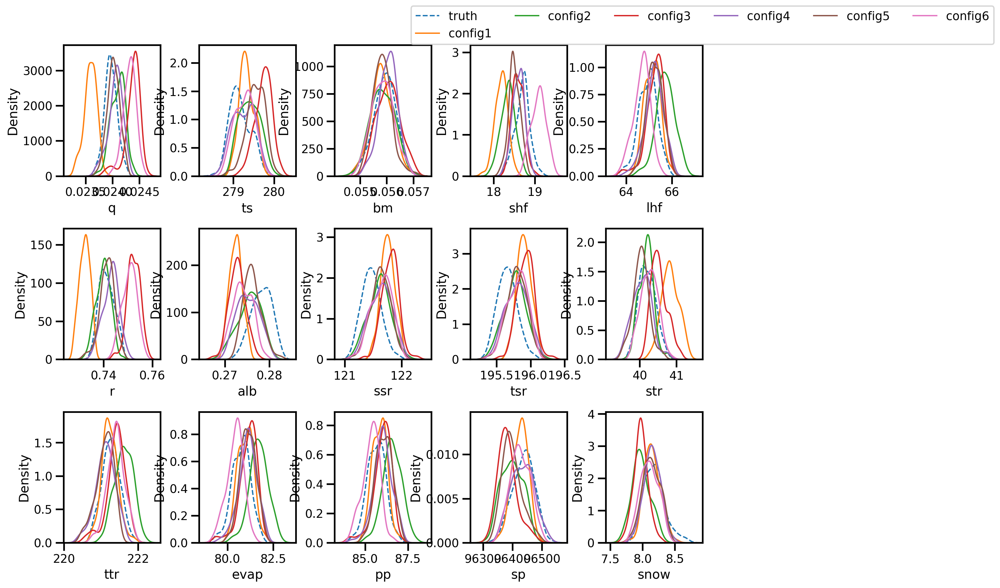

In [28]:
plot_distrib_atm([1,2,3,4,5,6], "CANDIDATE")

In [29]:
[KL_div_obs(n, "CANDIDATE")[:3] for n in range(1,7)]

[(0.17151177601559148, 24, []),
 (0.4445676627748226, 24, []),
 (0.5567924744580528, 24, []),
 (0.1467190095045791, 24, []),
 (0.23508344502618406, 24, []),
 (0.2057291634159783, 24, [])]

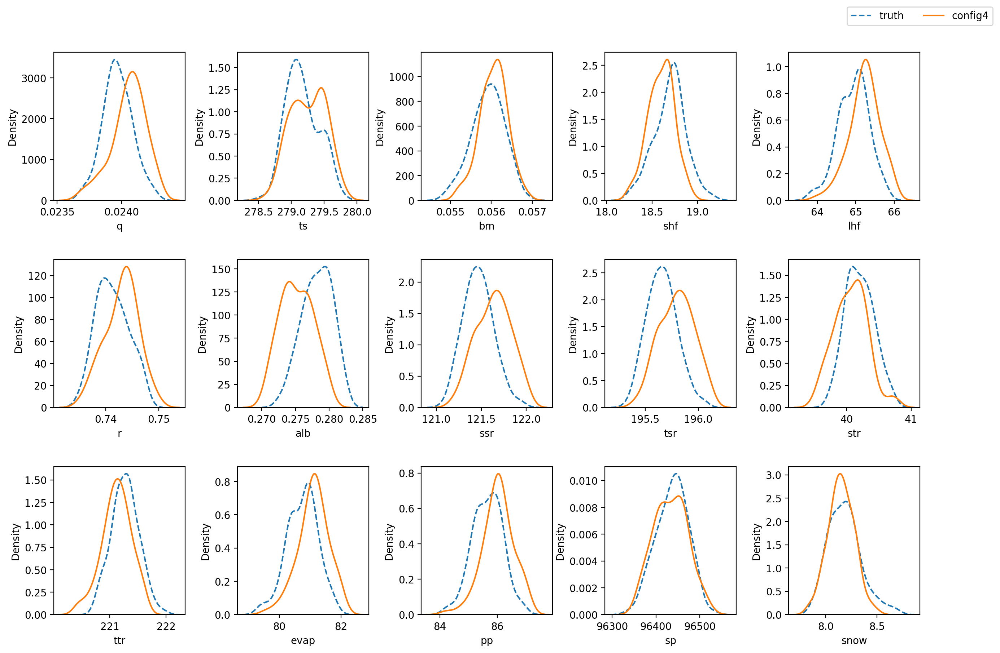

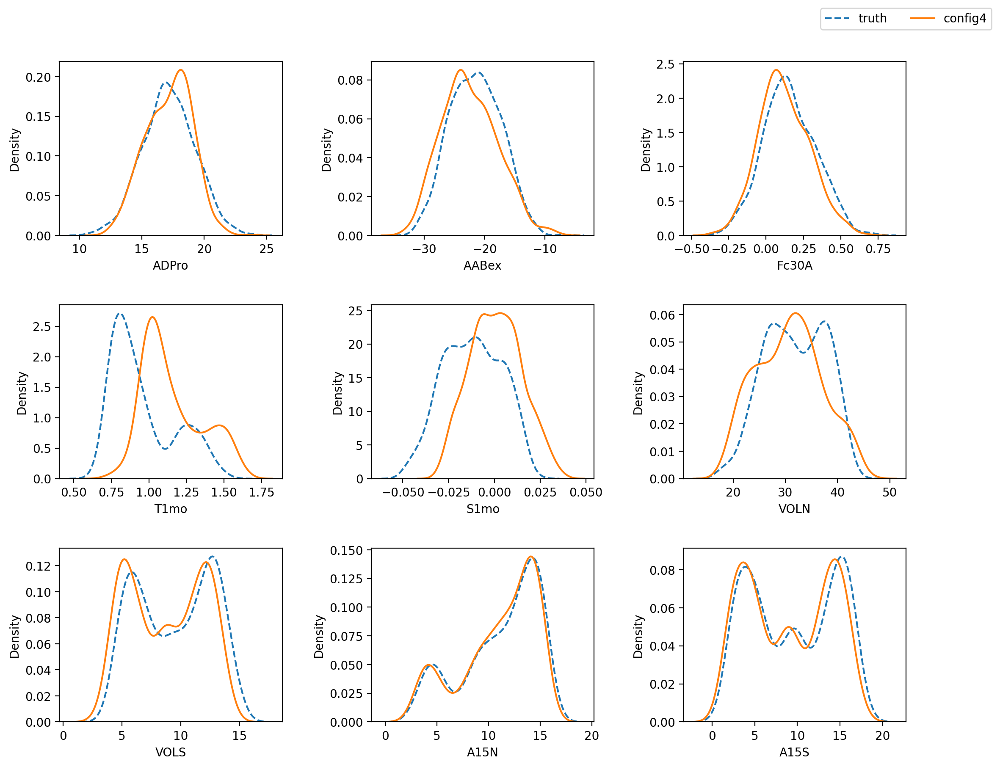

In [42]:
# best
plot_distrib_atm([4], "CANDIDATE")
plot_distrib_evolu([4],"CANDIDATE")

## 2. ATM-EVO_MEAN20L
Comparison on 100 years simulations

In [30]:
EXP = "100ATM-EVO_MEAN_20L"

### a. K means on wave 1 

In [31]:
configs20_k = format_candidates_iloveclim("k_means", 1)

,0,1,2,3,4,5,6,7,8
0,1.272138,0.378191,0.833443,0.778100,262.461074,324.231536,0.002478,0.000027,0.039900
1,1.150938,0.391868,0.819745,0.763948,311.637663,317.651475,0.002564,0.000015,0.040041
2,1.315109,0.374739,0.843287,0.812917,363.501704,838.663899,0.002808,0.000020,0.041398
3,1.226911,0.343112,0.832077,0.697553,395.689073,328.274791,0.001817,0.000015,0.086232
4,0.665340,0.484325,0.852833,0.724864,639.995680,235.465666,0.001544,0.000013,0.050411
5,1.201241,0.357961,0.856235,0.801951,408.009396,270.922387,0.001939,0.000018,0.022427
6,0.769061,0.499547,0.852674,0.837749,337.287011,284.497089,0.002383,0.000017,0.035348
7,0.724006,0.518225,0.824396,0.751858,309.253938,321.307462,0.002406,0.000016,0.076202
8,1.337883,0.350843,0.809755,0.696332,268.663826,671.400319,0.002648,0.000018,0.082151


In [32]:
wave1_metrics20 = get_metrics_candidates(9, "CANDIDATE1W")
wave1_PCA20 = reduce_pca_usingwave1(wave1_metrics20, SC, PC)

,config1,config2,config3,config4,config5,config6,config7,config8,config9,Obs
PC1,-3.281349,-2.726133,-3.495218,-2.333244,-2.284973,-2.786002,-2.630512,-2.621322,-2.496342,-2.559873
PC2,1.578006,1.426059,1.829001,2.183194,2.569030,2.451345,2.117211,1.541641,1.630986,1.785502
PC3,0.022676,-0.175585,-0.256684,0.274472,0.517640,0.132526,-0.302271,-0.082665,0.062818,0.207387
PC4,0.724978,0.747132,1.052439,1.596126,1.079672,1.070120,0.717405,0.768069,1.088527,0.890517
PC5,-0.074467,0.304444,0.317535,-0.172657,-0.433856,-0.002937,-0.209653,-0.252739,0.432417,-0.152073
PC6,-0.706616,-0.971608,-0.920935,-1.289909,-1.329909,-0.977440,-0.721133,-0.955863,-0.921975,-1.117770
PC7,0.474206,0.595741,0.673334,0.733273,0.911873,1.055376,0.603480,0.457949,0.647752,0.426662
PC8,-0.193791,-0.071226,-0.197607,-0.145133,-0.287976,-0.327664,-0.428979,-0.200641,-0.044176,-0.015803
PC9,0.012804,0.027297,-0.067669,-0.295535,-0.096239,0.007664,0.287033,0.123154,-0.221735,0.045110
PC10,-0.488985,-0.392793,-0.719618,-0.240972,0.042866,-0.462365,-0.142725,-0.165342,-0.663764,-0.453128


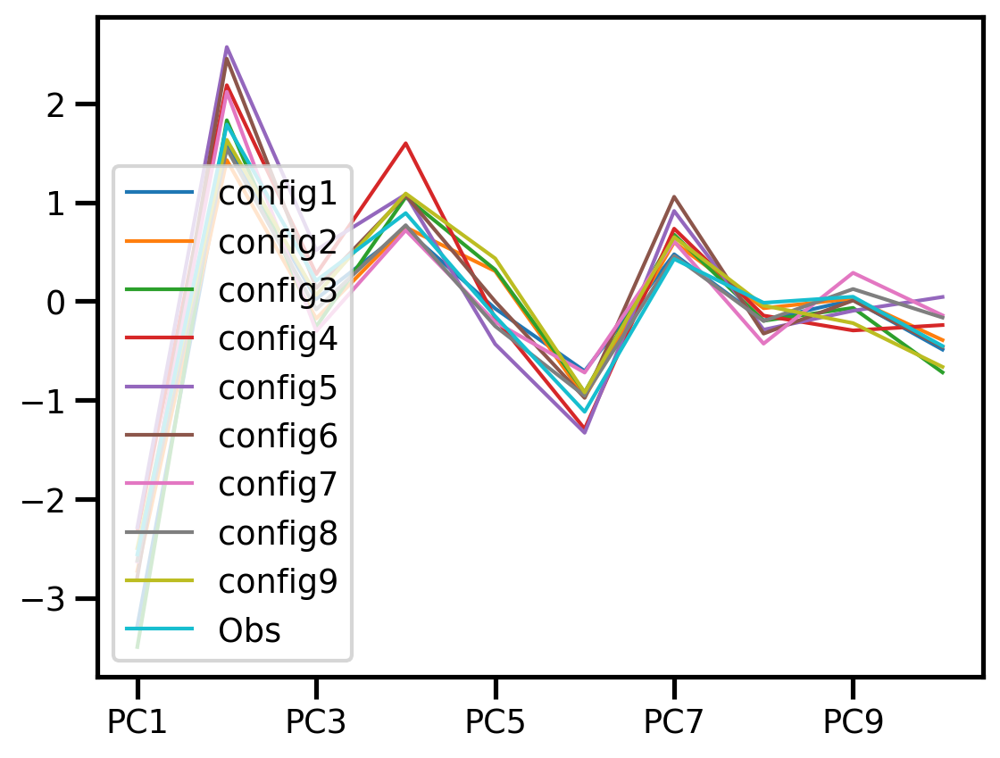

In [33]:
plot_PCA_candidates(wave1_PCA20,9)

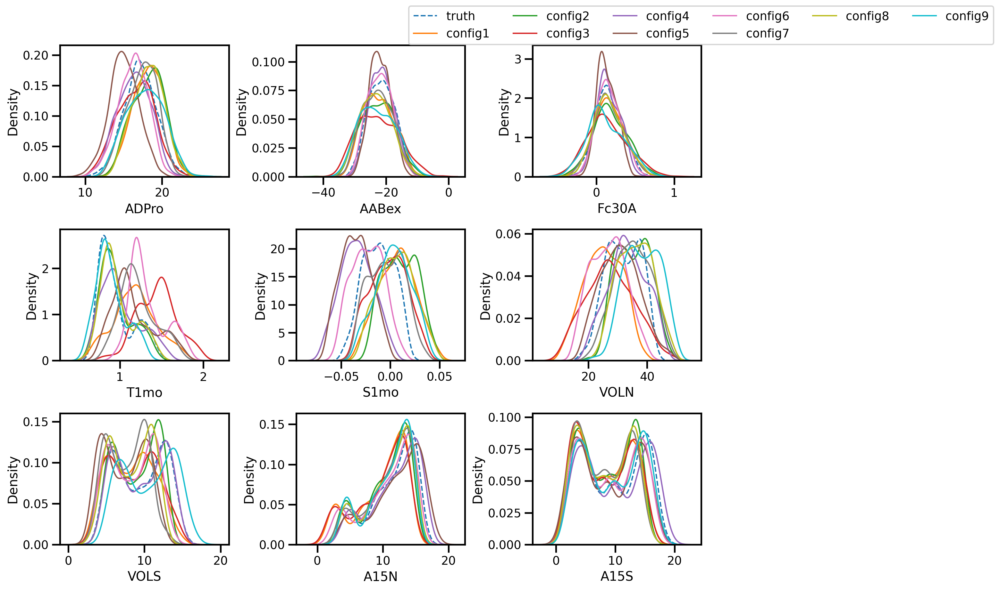

In [34]:
plot_distrib_evolu([1,2,3,4,5,6,7,8,9], "CANDIDATE1W")

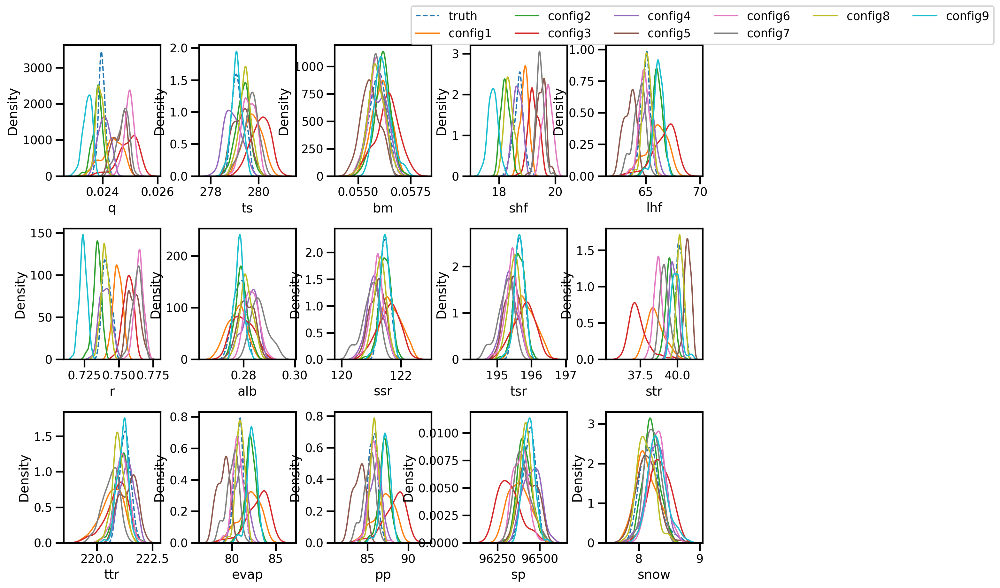

In [35]:
plot_distrib_atm([1,2,3,4,5,6,7,8,9], "CANDIDATE1W")

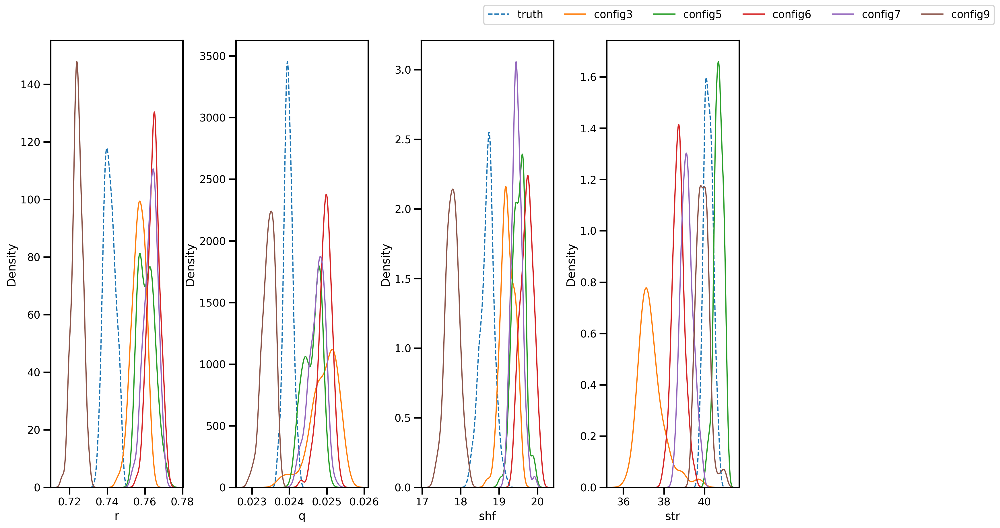

In [58]:
# fails 
plot_distrib_atm([3,5,6,7,9], "CANDIDATE1W")

In [43]:
[KL_div_obs(n, "CANDIDATE1W")[:3] for n in range(1,10)]

[(0.41703650988850127, 24, []),
 (0.19531836580264272, 24, []),
 (0.42608700905096264, 23, ['str']),
 (0.21080026412205735, 24, []),
 (0.43345286936614, 23, ['r']),
 (0.1520065142062964, 20, ['q', 'shf', 'r', 'str']),
 (0.49173496718989895, 22, ['shf', 'r']),
 (0.1577961525412623, 24, []),
 (0.14916319284447732, 22, ['shf', 'r'])]

In [25]:
# retry

In [26]:
EXP = "ATM-EVO_MEAN_20L_opt2"

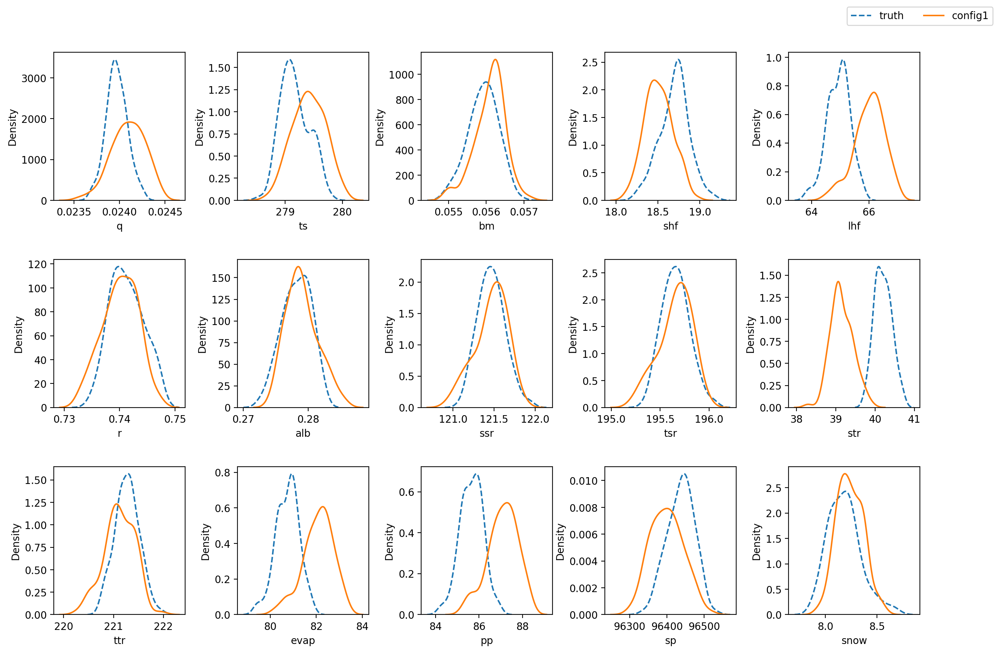

In [32]:
plot_distrib_atm([1], "candidates_wave_1")

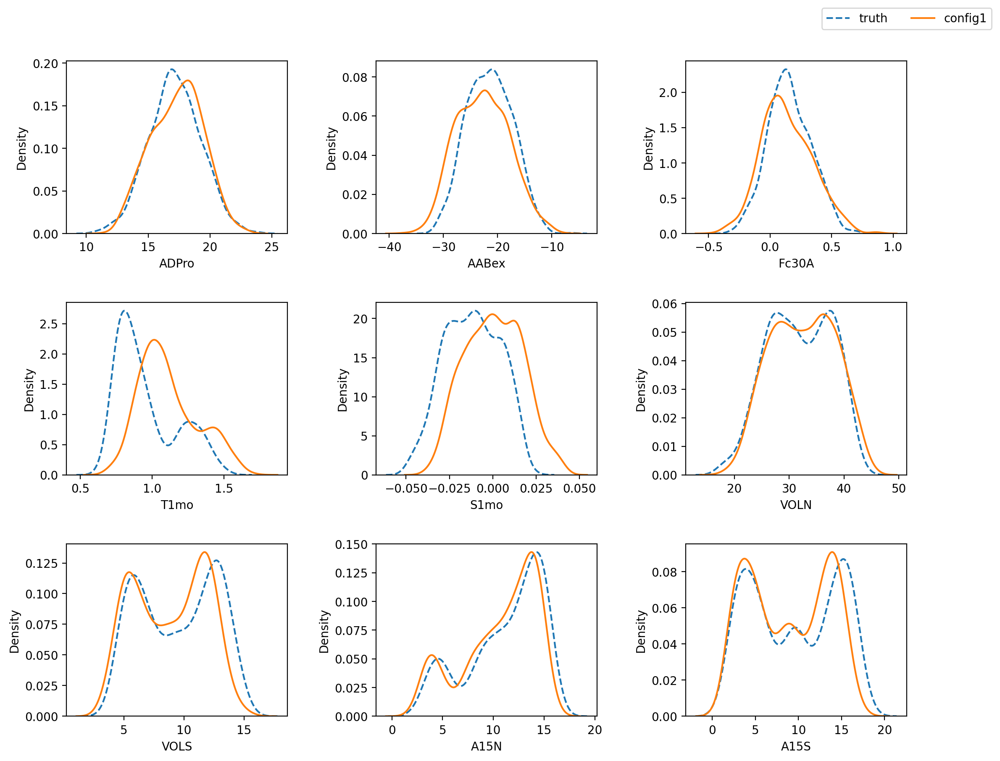

In [34]:
plot_distrib_evolu([1], "candidates_wave_1")

In [36]:
[KL_div_obs(n, "candidates_wave_1")[:3] for n in range(1,2)]

[(0.16438587398322765, 24, [])]

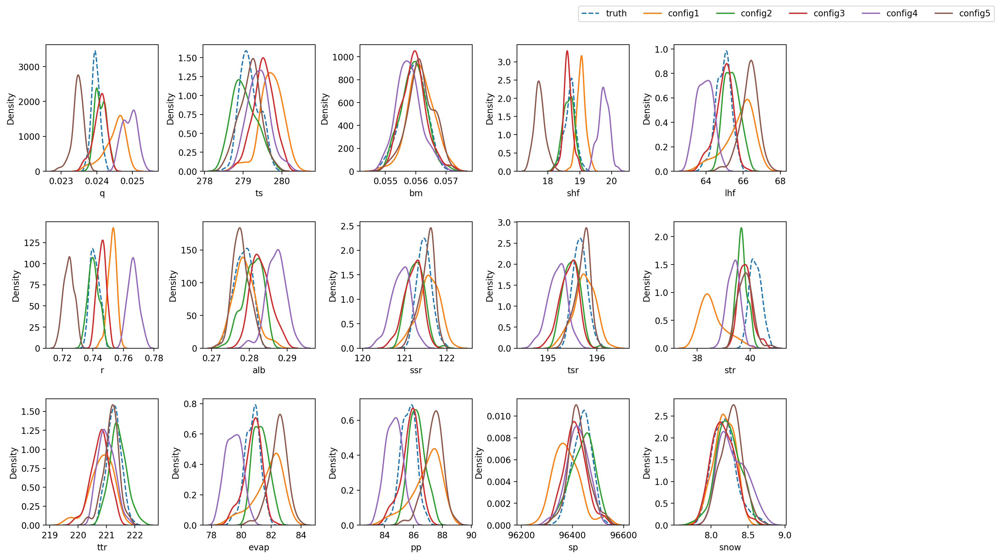

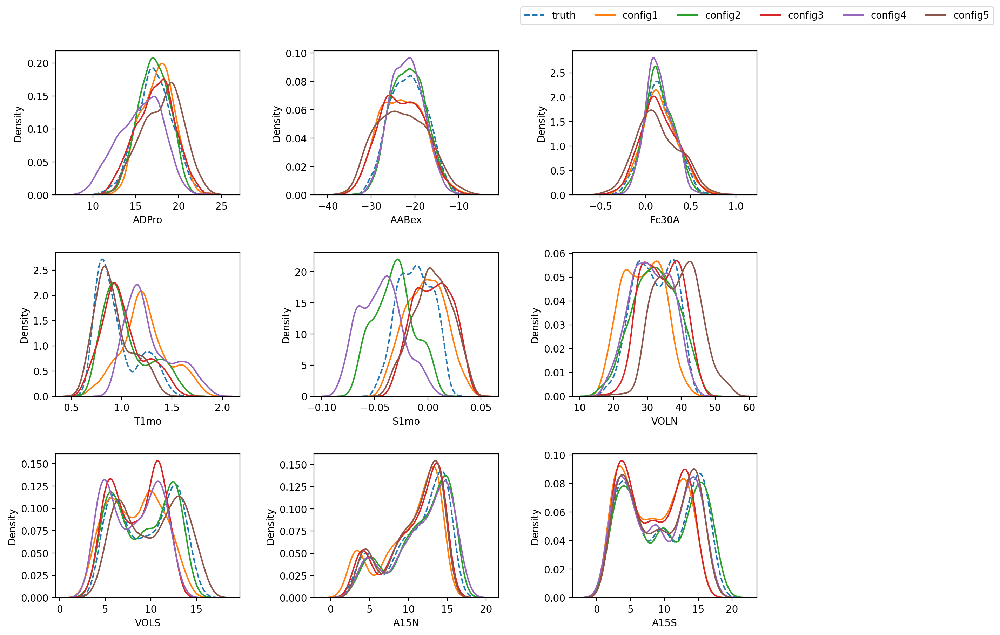

In [38]:
# opt_cluster = 6
EXP = "ATM-EVO_MEAN_20L_opt6"
plot_distrib_atm([1,2,3,4,5], 'candidates_wave_1')
plot_distrib_evolu([1,2,3,4,5], 'candidates_wave_1')

In [39]:
[KL_div_obs(n, "candidates_wave_1")[:3] for n in range(1,6)]

[(0.3567087663088586, 24, []),
 (0.14782871609940584, 24, []),
 (0.23467899418080684, 24, []),
 (0.30098121210077416, 21, ['q', 'shf', 'r']),
 (0.1469898509816056, 22, ['shf', 'r'])]

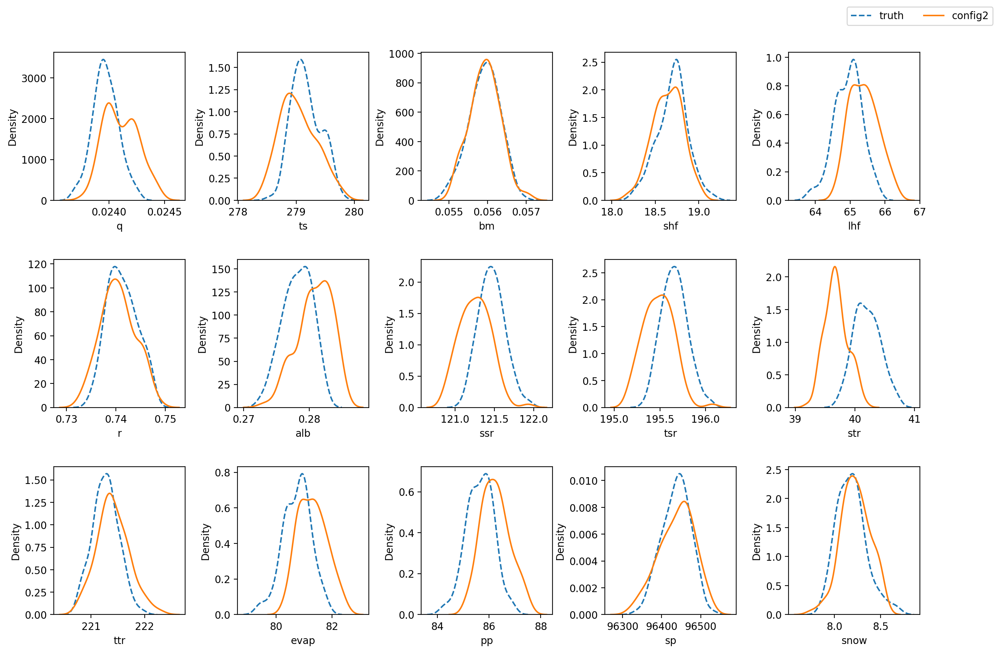

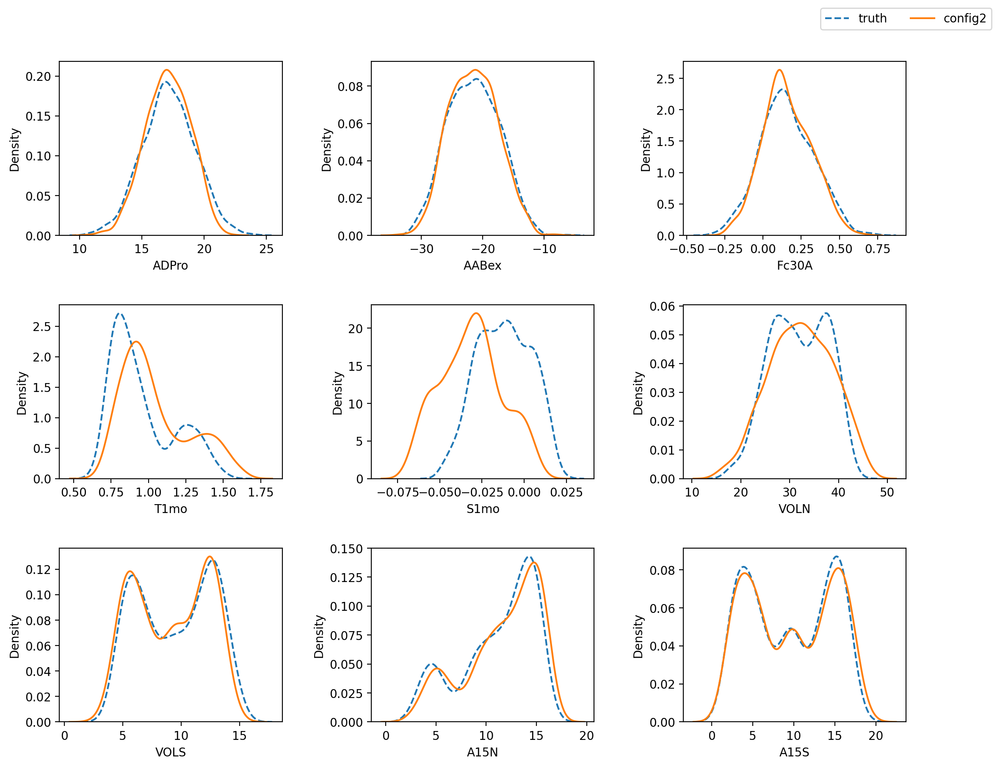

In [40]:
plot_distrib_atm([2], "candidates_wave_1")
plot_distrib_evolu([2], "candidates_wave_1")

### b. Direct candidates from wave 2 

In [37]:
configs20_d = format_candidates_iloveclim("direct", 2)

,0,1,2,3,4,5,6,7,8
0,1.350758,0.294100,0.841972,0.698948,485.546447,286.715465,0.001820,0.000012,0.050704
1,1.086580,0.386732,0.825225,0.673824,280.227868,938.877547,0.002849,0.000021,0.097275
2,0.693639,0.514658,0.816591,0.648133,218.799009,908.785076,0.002731,0.000015,0.093494


In [38]:
wave2_metrics20 = get_metrics_candidates(3, "CANDIDATE")
wave2_PCA20 = reduce_pca_usingwave1(wave2_metrics20, SC, PC)

,config1,config2,config3,Obs
PC1,-2.187412,-2.501034,-2.399696,-2.559873
PC2,2.043202,1.738831,1.814782,1.785502
PC3,0.264030,-0.234797,0.007980,0.207387
PC4,0.669410,0.844807,0.997277,0.890517
PC5,0.223978,0.054976,-0.138045,-0.152073
PC6,-1.271147,-1.274479,-1.300946,-1.117770
PC7,0.890031,-0.032539,-0.066554,0.426662
PC8,-0.060126,0.013913,0.167033,-0.015803
PC9,-0.030423,0.083891,0.107397,0.045110
PC10,-0.486836,-0.371081,-0.455831,-0.453128


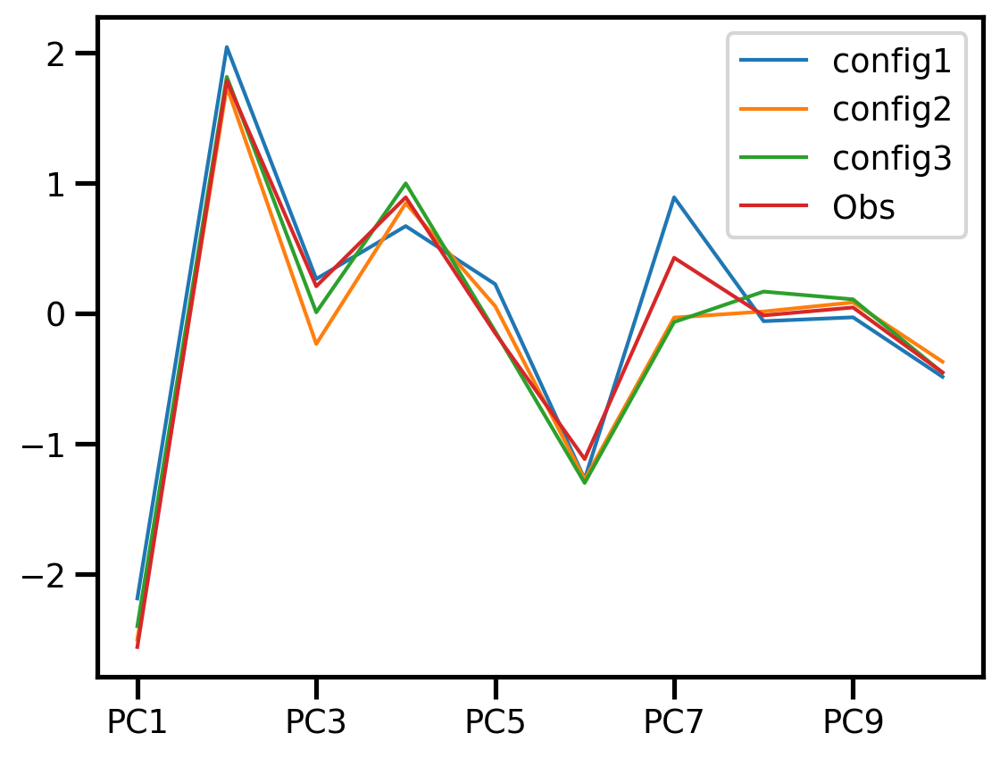

In [39]:
plot_PCA_candidates(wave2_PCA20,3)

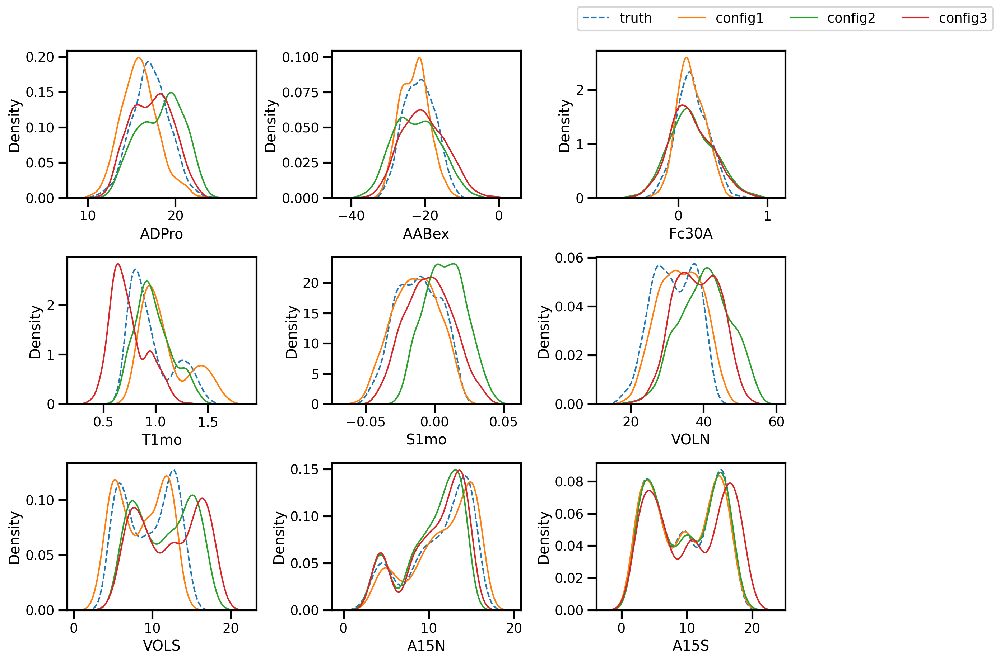

In [40]:
plot_distrib_evolu([1,2,3], "CANDIDATE")

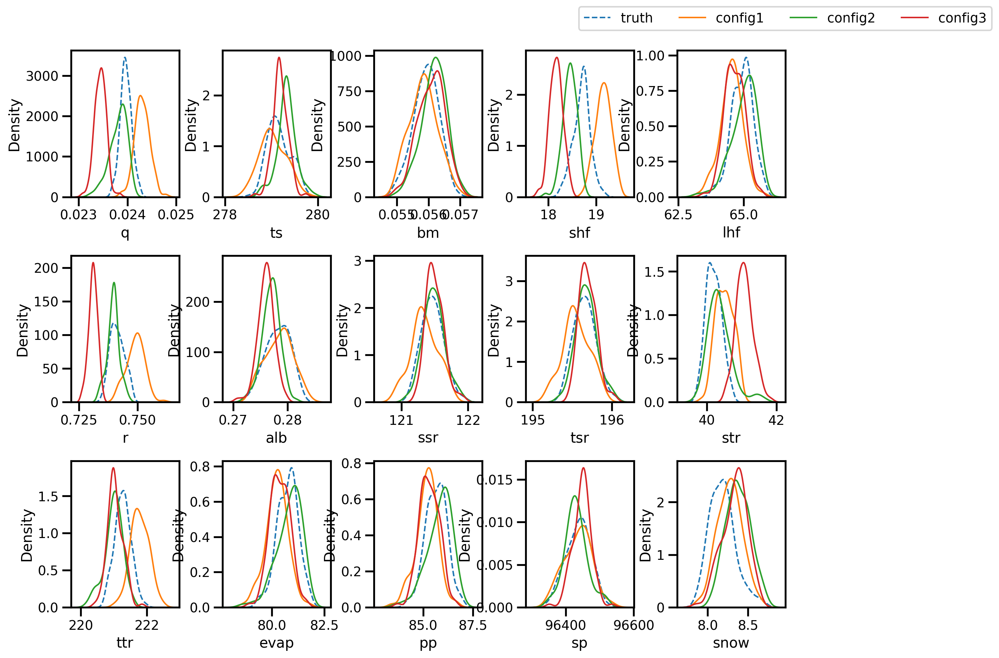

In [41]:
plot_distrib_atm([1,2,3], "CANDIDATE")

In [42]:
[KL_div_obs(n, "CANDIDATE")[:3] for n in range(1,4)]

[(0.2075011768538831, 24, []),
 (0.1908921245676427, 24, []),
 (0.3010604472674198, 24, [])]

## LIG-SHI candidates
We only look at present-day setup.
### a. Direct candidates wave 2  for start 2

In [139]:
EXP = "100SHI2_ATM-EVO_MEAN_20L_direct"

In [151]:
configs_lig_shi_d2 = pd.read_csv(f'../Data/LIG-SHI/{EXP[6:-7]}/direct_candidates_wave_2.csv').values
display(configs_lig_shi_d2)

array([[1.22898446e+00, 3.60847045e-01, 8.40454213e-01, 6.85219124e-01,
        3.17337194e+02, 6.79265822e+02, 2.61362282e-03, 1.15276335e-05,
        7.14512354e-02],
       [6.65893430e-01, 5.40025108e-01, 8.25655834e-01, 7.26585827e-01,
        3.45681451e+02, 6.73401928e+02, 2.44543891e-03, 1.10848932e-05,
        6.73170138e-02]])

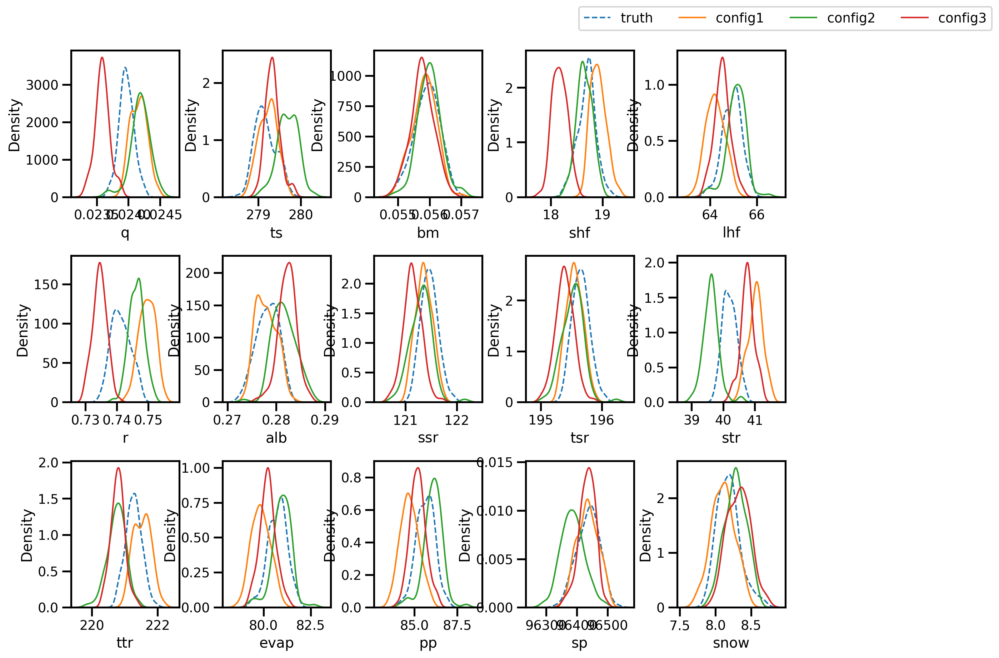

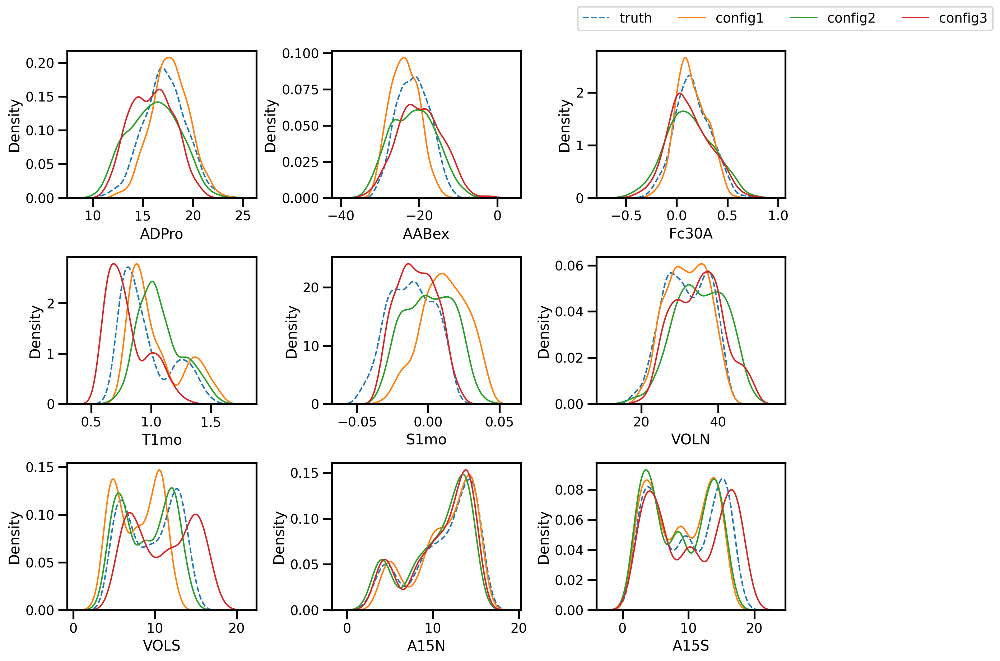

In [140]:
plot_distrib_atm([1,2,3],"CANDIDATE2")
plot_distrib_evolu([1,2,3],"CANDIDATE2" )

In [141]:
[KL_div_obs(n, "CANDIDATE2")[:3] for n in range(1,4)]

[(0.27562053431286637, 24, []),
 (0.3161386999306177, 24, []),
 (0.49521081654320187, 24, [])]

### b. Direct candidates wave 2 for start 3

In [142]:
EXP = "100SHI3_ATM-EVO_MEAN_20L_direct"

In [152]:
configs_lig_shi_d3 = pd.read_csv(f'../Data/LIG-SHI/{EXP[6:-7]}/direct_candidates_wave_2.csv').values
display(configs_lig_shi_d3)

array([[1.22898446e+00, 3.60847045e-01, 8.40454213e-01, 6.85219124e-01,
        3.17337194e+02, 6.79265822e+02, 2.61362282e-03, 1.15276335e-05,
        7.14512354e-02],
       [6.65893430e-01, 5.40025108e-01, 8.25655834e-01, 7.26585827e-01,
        3.45681451e+02, 6.73401928e+02, 2.44543891e-03, 1.10848932e-05,
        6.73170138e-02]])

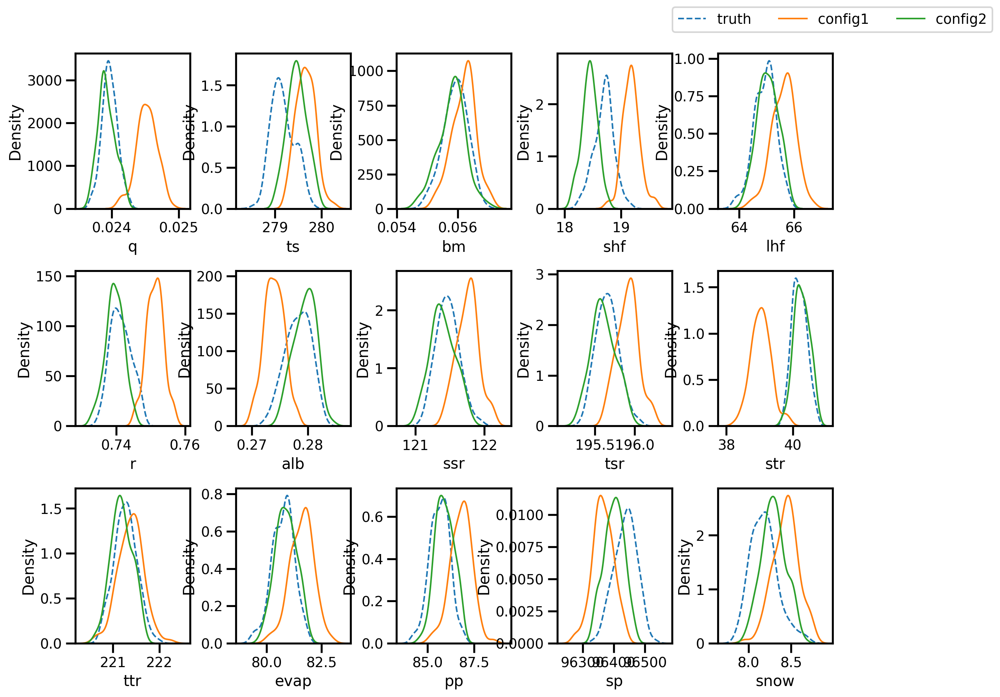

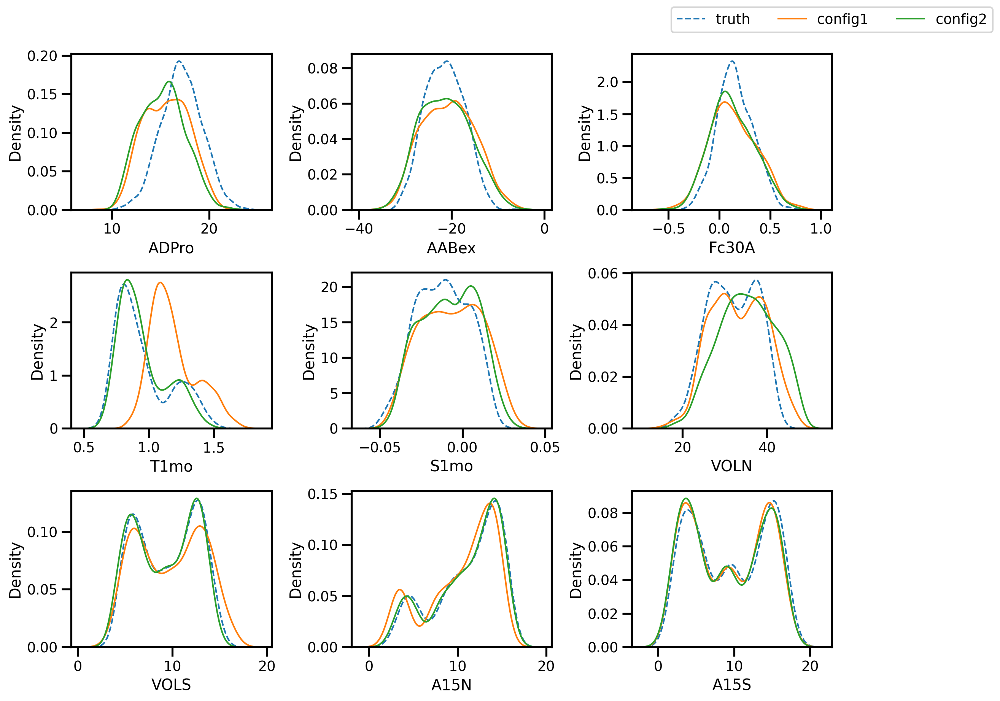

In [143]:
plot_distrib_atm([1,2],"CANDIDATE2")
plot_distrib_evolu([1,2],"CANDIDATE2" )

In [144]:
[KL_div_obs(n, "CANDIDATE2")[:3] for n in range(1,3)]

[(0.8479191477312107, 24, []), (0.1381745965339221, 24, [])]

## Best candidates
### Distributions

In [115]:
EXP = "100ATM-EVO_MEAN_20L"

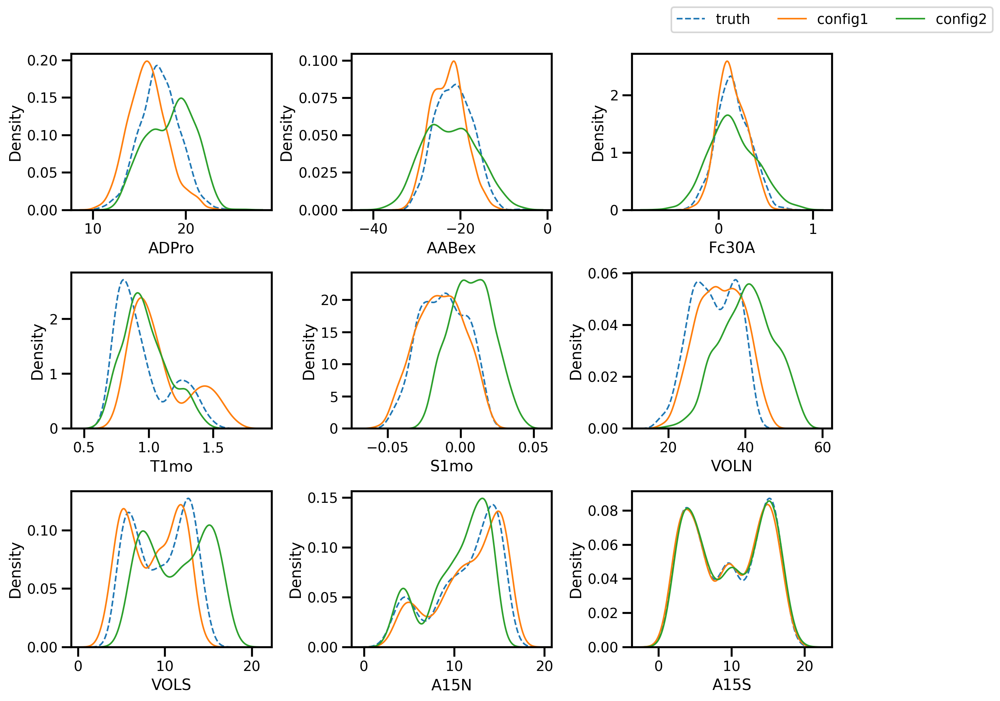

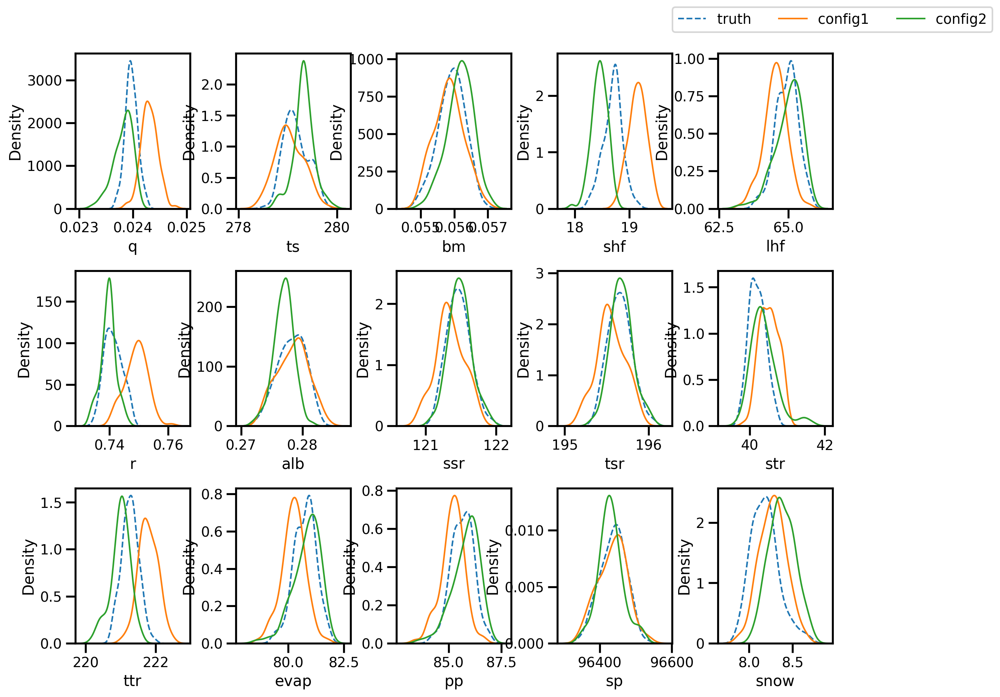

In [45]:
# wave 2 mean 20
plot_distrib_evolu([1,2], "CANDIDATE")
plot_distrib_atm([1,2], "CANDIDATE")

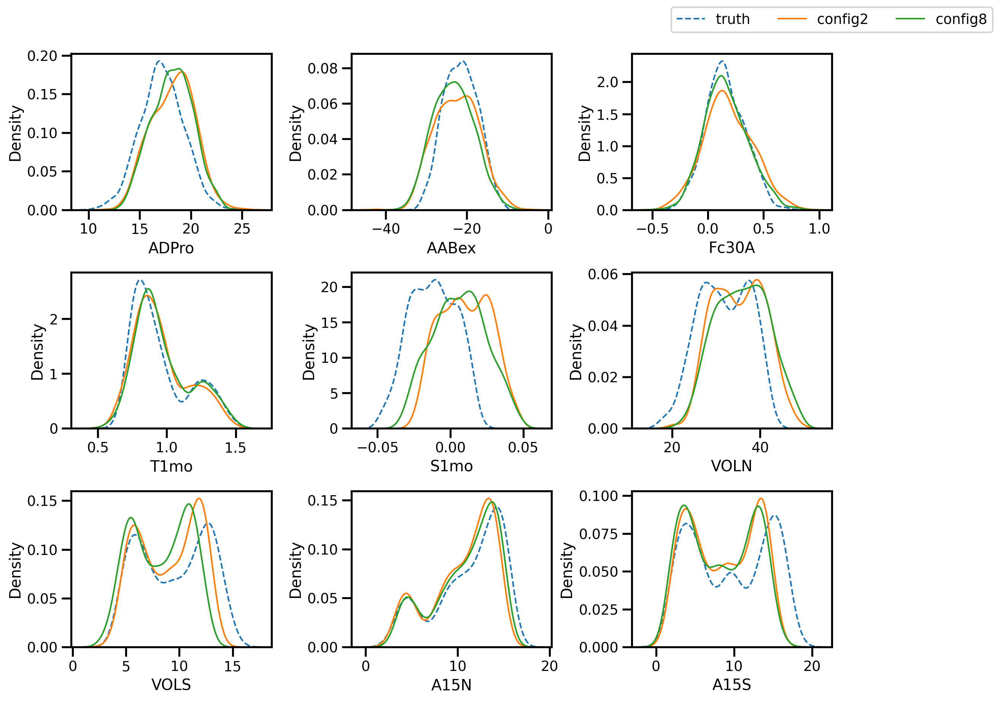

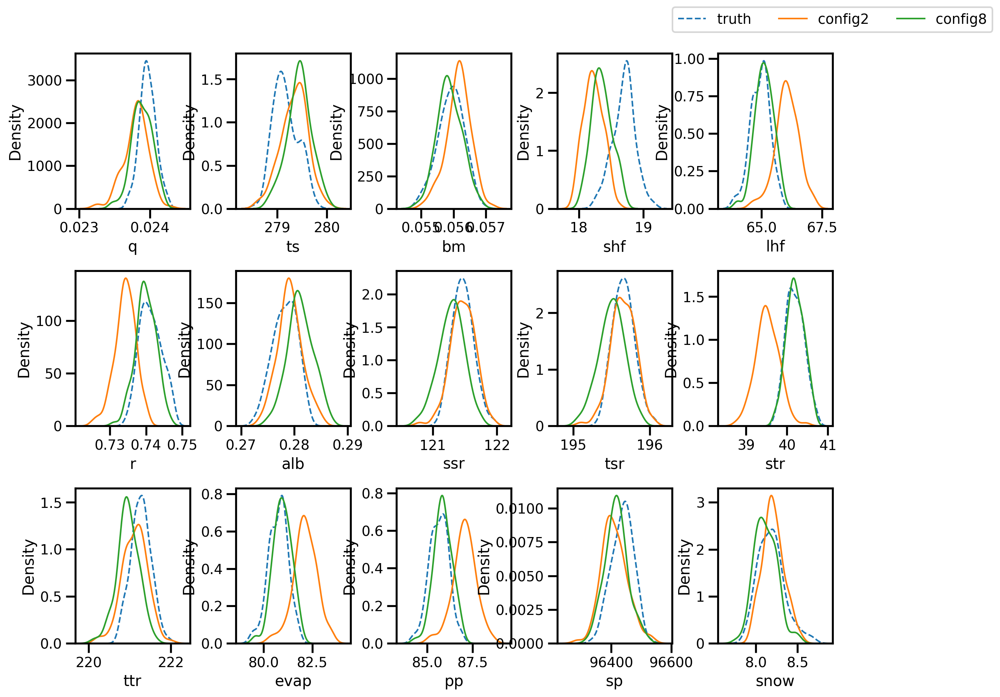

In [46]:
# wave 1 mean 20
plot_distrib_evolu([2,8], "CANDIDATE1W")
plot_distrib_atm([2,8], "CANDIDATE1W")

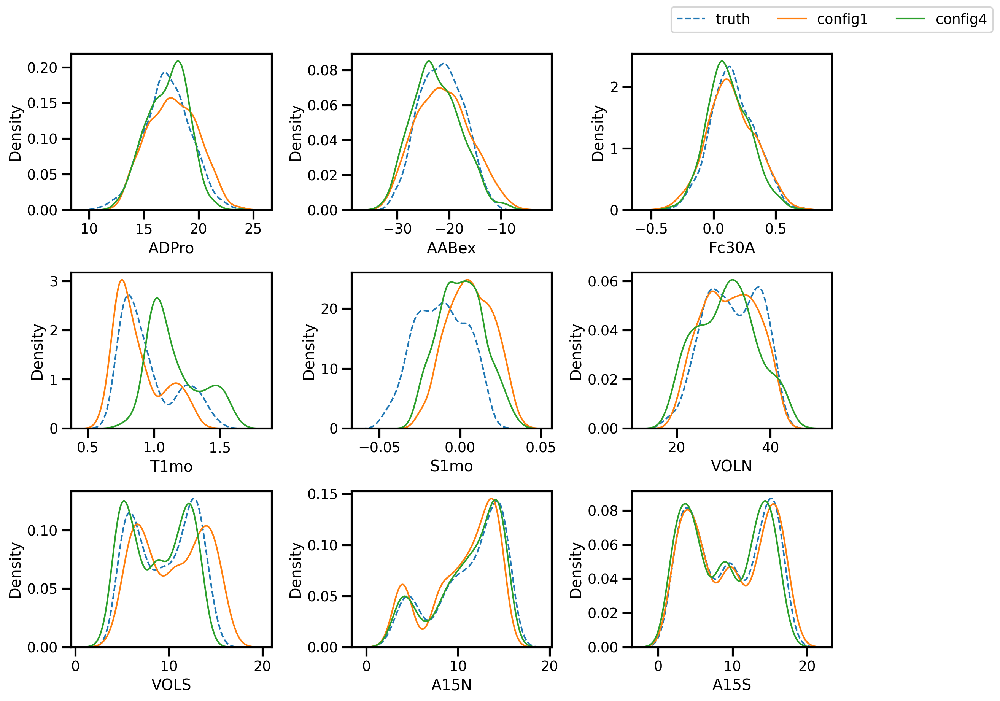

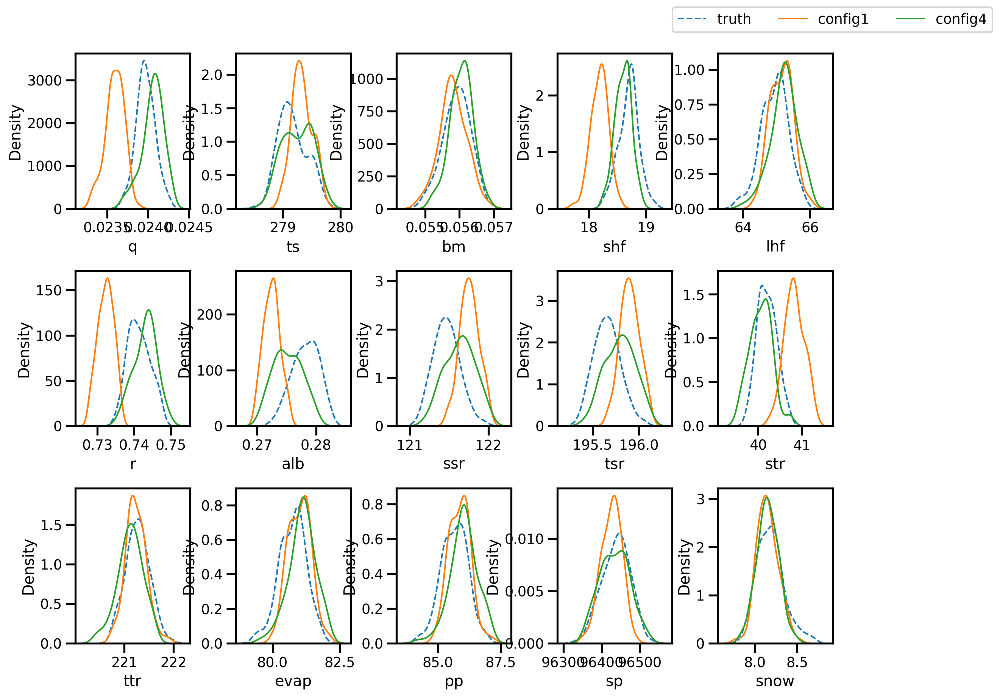

In [47]:
EXP = "ATM-EVO_MEAN_100L"
plot_distrib_evolu([1,4], "CANDIDATE")
plot_distrib_atm([1,4], "CANDIDATE")

### KL-div of all metrics 

In [180]:
ent_dict_list = []
exp_list = [("100ATM-EVO_MEAN_20L",[2,8],"CANDIDATE1W"), ("100ATM-EVO_MEAN_20L",[1,2],"CANDIDATE"), ("ATM-EVO_MEAN_100L",[1,4],"CANDIDATE")]
for exp in exp_list:
    EXP, nb_list, candidate_name = exp
    for nb in nb_list:
        ent_dict_list.append(KL_div_obs(nb, candidate_name)[3])


In [181]:
df = pd.DataFrame.from_records(ent_dict_list) #,index=['1', '2'])
df

,q,ts,bm,shf,lhf,r,alb,ssr,tsr,str,...,snow,ADPro,AABex,Fc30A,T1mo,S1mo,VOLN,VOLS,A15N,A15S
0,0.466427,0.264395,0.205881,2.003256,0.931069,1.765046,0.070496,0.021118,0.038589,1.303326,...,0.147359,0.144367,0.086280,0.055617,0.042761,0.592660,0.184756,0.108323,0.094090,0.210655
1,0.174802,0.553005,0.070902,1.294607,0.134223,0.113554,0.370584,0.359785,0.372019,0.082177,...,0.113468,0.140790,0.100811,0.018896,0.045106,0.436912,0.186420,0.253369,0.041059,0.242285
2,1.677719,0.279276,0.049928,2.022549,0.460211,0.719491,0.047788,0.224116,0.190887,0.561367,...,0.243444,0.182559,0.065253,0.025142,0.420179,0.015287,0.056364,0.086425,0.046157,0.001284
3,0.266107,0.553738,0.187700,0.934898,0.132469,0.201563,0.369850,0.042874,0.041353,0.097666,...,0.681766,0.249195,0.164566,0.103570,0.166472,0.656793,0.433952,0.284639,0.140020,0.010141
4,2.460188,0.475608,0.081952,2.162453,0.220069,3.175769,2.564588,1.584898,1.376694,1.725532,...,0.125314,0.058837,0.076900,0.015789,0.177733,0.609710,0.021630,0.134307,0.091908,0.014574
5,0.362256,0.132978,0.112844,0.291438,0.178987,0.160460,0.616137,0.449616,0.360189,0.175644,...,0.096761,0.036005,0.046569,0.026963,0.802457,0.313755,0.113246,0.070211,0.020454,0.049073


In [191]:
# KL-div moyenne par variable
for k in range(24):
    print(list(ent_dict_list[0].keys())[k], df[:][list(ent_dict_list[0].keys())[k]].mean())

q 0.9012497829280107
ts 0.37650003485436484
bm 0.11820135643024486
shf 1.4515335338189737
lhf 0.34283801591557345
r 1.0226469547959385
alb 0.6732407145761125
ssr 0.4470678102317925
tsr 0.39662164129139543
str 0.6576186969753393
ttr 0.43627754918686423
evap 0.33650001826469794
pp 0.4074213135760864
sp 0.16826621950307807
snow 0.2346854720780676
ADPro 0.13529231969484193
AABex 0.0900630791756988
Fc30A 0.04099626065876558
T1mo 0.275784774116158
S1mo 0.43751961719572713
VOLN 0.16606133288792885
VOLS 0.1562125205904171
A15N 0.07228150983876659
A15S 0.08800195745080513


### Distance from ground truth parameters

In [153]:
def norm(array1, array2):
    return pd.Series(np.abs(array1 - array2))

def relative_error(arraytruth, array):
    ar = np.abs(arraytruth - array)
    ar = ar/arraytruth
    return pd.Series(ar)

In [154]:
param_truth

{'ampwir': 1.0,
 'expir': 0.4,
 'relhmax': 0.83,
 'alphd': 0.72,
 'ai': 300,
 'cwdrag': 0.0021,
 'aitd': 300,
 'avkb': 1.5e-05,
 'cgren': 0.04}

In [155]:
p_truth = np.array([1,0.4,0.83,0.72,300,300,0.0021,1.5e-05,0.04])

In [156]:
mean100_1 = configs100[0]
mean100_4 = configs100[3]
mean20_k_2 = configs20_k[1]
mean20_k_8 = configs20_k[7]
mean20_d_1 = configs20_d[0]
mean20_d_2 = configs20_d[1]
lig_shi3_d_2 = configs_lig_shi_d3[1]
best_candidates_list = [mean100_1, mean100_4,mean20_k_2,mean20_k_8,mean20_d_1,mean20_d_2, lig_shi3_d_2]

In [157]:
best_array = norm(p_truth,mean100_1)
for candidate in best_candidates_list[1:]:
    best_array = pd.concat([best_array,norm(p_truth,candidate)], axis=1)
best_array =best_array.T

In [159]:
best_array

,0,1,2,3,4,5,6,7,8
0,0.190918,0.070196,0.014244,0.079519,16.616262,354.916126,0.000300,3.882116e-06,0.043611
1,0.263280,0.058480,0.000689,0.017688,175.236399,276.267357,0.000036,1.224099e-05,0.001111
0,0.150938,0.008132,0.010255,0.043948,11.637663,17.651475,0.000464,1.441676e-07,0.000041
0,0.275994,0.118225,0.005604,0.031858,9.253938,21.307462,0.000306,7.538125e-07,0.036202
0,0.350758,0.105900,0.011972,0.021052,185.546447,13.284535,0.000280,2.756190e-06,0.010704
0,0.086580,0.013268,0.004775,0.046176,19.772132,638.877547,0.000749,6.275513e-06,0.057275
0,0.334107,0.140025,0.004344,0.006586,45.681451,373.401928,0.000345,3.915107e-06,0.027317


In [160]:
error_array = relative_error(p_truth,mean100_1)
for candidate in best_candidates_list[1:]:
    error_array = pd.concat([error_array,relative_error(p_truth,candidate)], axis=1)
error_array =error_array.T
error_array

,0,1,2,3,4,5,6,7,8
0,0.190918,0.175489,0.017161,0.110442,0.055388,1.183054,0.143026,0.258808,1.090273
1,0.263280,0.146201,0.000830,0.024567,0.584121,0.920891,0.017056,0.816066,0.027763
0,0.150938,0.020331,0.012355,0.061039,0.038792,0.058838,0.221146,0.009611,0.001031
0,0.275994,0.295564,0.006752,0.044247,0.030846,0.071025,0.145502,0.050254,0.905045
0,0.350758,0.264749,0.014424,0.029239,0.618488,0.044282,0.133217,0.183746,0.267611
0,0.086580,0.033170,0.005752,0.064133,0.065907,2.129592,0.356835,0.418368,1.431873
0,0.334107,0.350063,0.005234,0.009147,0.152272,1.244673,0.164495,0.261007,0.682925


In [162]:
# erreur moyenne par colonne 
for k in range(9):
    print(error_array[:][k].mean())

0.23608232458720174
0.18365245783740144
0.008929823087172233
0.048973503864676984
0.22083061456759237
0.8074792527149743
0.16875363640624497
0.2854085162131581
0.6295030983862635


In [163]:
mean_error = np.array([error_array[:][k].mean() for k in range(9)])

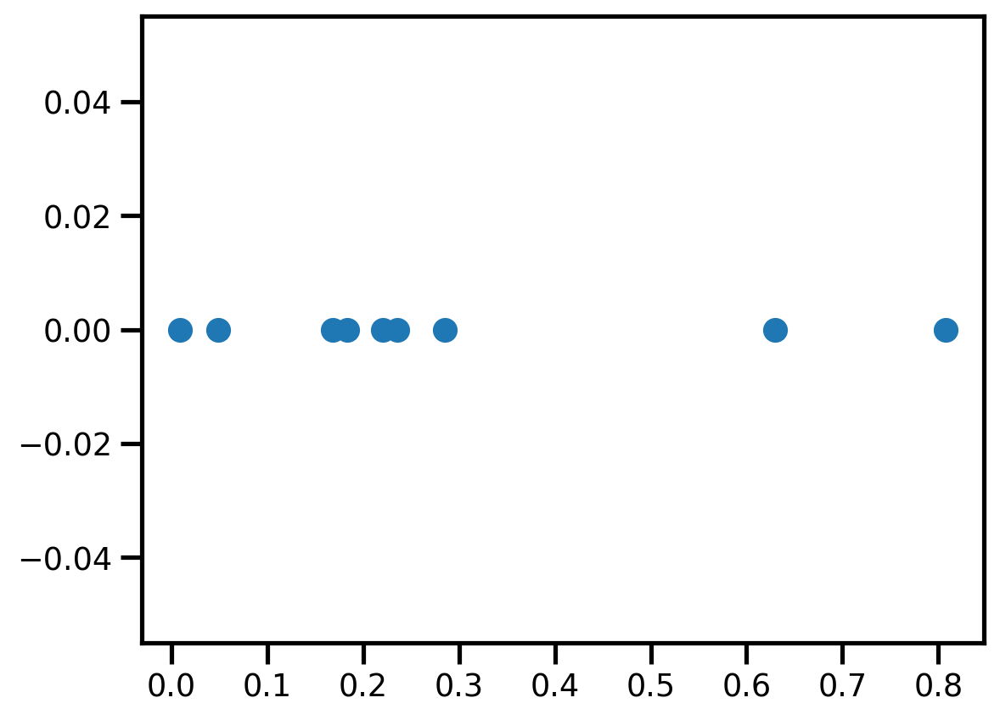

In [164]:
plt.scatter(mean_error,np.zeros(9))